In this notebook the autocorrelations function and time scale is computed for neurons and neurites activity as well as the behaviors
The data is first smoothed or interpolated with different methods.
Autocorrelation fuction can be derived for different versions of the data (smoothed, gap-filled,interpolated, ...) but in the end most plots are generated for not-smoothed raw data. You can generate them again by replacing raw data (MegaData0) with smoothed (MegaData) or intepolated (MegaData_interp) data.

In [1]:
import h5py
import numpy as np
import Functions.Binning as Bin
import Functions.Regressors as Rss
import copy
import importlib
import matplotlib.pyplot as plt
import Functions.AllFunctions as AllF
import Functions.Make_pandaBinsDataset as MPB
import pandas as pd
from scipy.signal import correlate
from scipy.optimize import curve_fit
import math
import Functions.Autocorr as Aut
from scipy.signal import find_peaks
from scipy.signal import savgol_filter
from numpy.polynomial.polynomial import Polynomial

/Users/mahsa/Documents/phd-thesis-code/Plotting


# Read and Prepare data

In [2]:
h5 = h5py.File('MegaData7_7worms_V6.h5', 'r')

In [3]:
outDir = '/Users/mahsa/Documents/Plotting/AutoCorr/'
res = 300# resolution of the images you save

In [4]:
L= h5['data_sets_info/lowercam_length']
MegaData0 = np.copy(h5['data/dataraw'])
MegaData0[np.isnan(MegaData0)]=0

In [5]:
MegaData =copy.deepcopy(MegaData0)

In [6]:
smooth=True
gapfilled = True
numW=7

In [7]:
for i in range(55):
    if i >12 and not (i in [27,28,39,40]):
        MegaData[5,:243,i] = 0
        MegaData0[5,:243,i] = 0


for i in range(55):
    MegaData[6,L[6]:,i] = 0
    MegaData0[6,L[6]:,i] = 0

In [8]:
sm = [2,2,2,3,4,3,3]
g=[5,5,5,7,10,7,7]
if smooth:
    for d in range(7):
        for i in range(55):
            if not (i in [10,11,12]):
                MegaData[d,:L[d],i] = Bin.smooth_vec_long(MegaData0[d,:L[d],i],sm[d],g[d])

MegaData_filled =copy.deepcopy(MegaData0)
importlib.reload(AllF)
if gapfilled:
    for d in range(7):
        for i in range(55):
            if not (i in [10,11,12]):
                MegaData_filled[d,:L[d],i] = AllF.fill_in_gaps(MegaData0[d,:L[d],i],g[d])

MegaData_fs =copy.deepcopy(MegaData0)
if smooth and gapfilled:
    for d in range(7):
        for i in range(55):
            if not (i in [10,11,12]):
                MegaData_fs[d,:L[d],i] = Bin.smooth_vec_long(MegaData_filled[d,:L[d],i],sm[d],g[d])

In [9]:
MegaData_filled[MegaData_filled==0] = np.nan

In [10]:
MegaData_interp = copy.deepcopy(MegaData_filled)
for d in range(numW):
    for n in range(55):
        if not (n in [10,11,12]):
            time = MegaData0[d,:L[d],12]
            values = MegaData_filled[d,:L[d],n]
            df = pd.DataFrame({'time': time, 'values': values})
            window_size = 3
            df['values2'] = df['values'].interpolate(method='linear')
            smoothed_values1 = savgol_filter(df['values2'], window_length=5, polyorder=1)
            df['smoothed_values1'] = smoothed_values1
            MegaData_interp[d,:L[d],n] = smoothed_values1

In [11]:
MegaData_interp[np.isnan(MegaData_interp)]=0
MegaData_filled[np.isnan(MegaData_filled)]=0

## Plot different autocorrelation functions with or without considering 0 values to test.
`Aut.nan_correlate2` is used for Fig. 4.8

In [12]:
#%matplotlib widget

In [72]:
# Compute autocorrelation
importlib.reload(Aut)
d0=4
n=4
x= copy.deepcopy(MegaData_filled[d0,:L[d0],n])
autocorr = np.correlate(x, x, mode='full')
norm_cross_corr = Aut.norm_cross_corr(x, x, mod='full')#remove mean and divide by std
norm_cross_corr_zer = Aut.norm_cross_corr(x, x, mod='full',zeros=1)#remove mean and divide by std
autocorr_s,normfac =Aut.autocorrelation_s(x)#remove mean and divide by std ony for nonzero values
x[x==0]= np.nan
autocorrnan_corr,lagsnanco2 = Aut.nan_correlate2(x, x, mode='full')# take care of invalid values and the main function for thesis plots
# Center the result
lags = np.zeros(2*len(x)-1)
lags[:len(x)] = -MegaData0[d0,:L[d0],12][::-1]+MegaData0[d0,0,12]
lags[len(x):] = MegaData0[d0,1:L[d0],12]- MegaData0[d0,0,12]


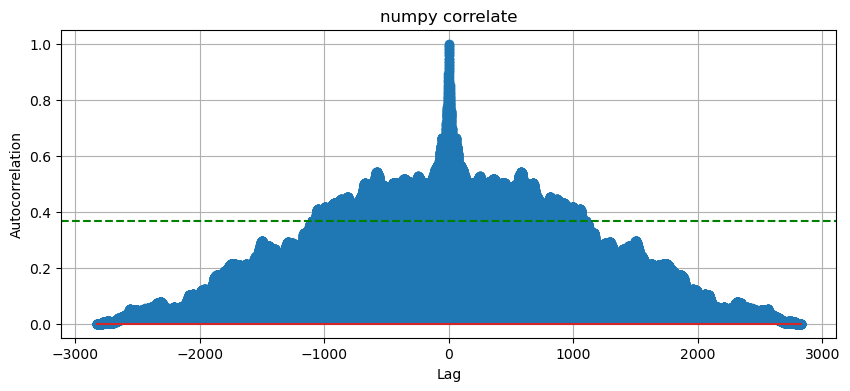

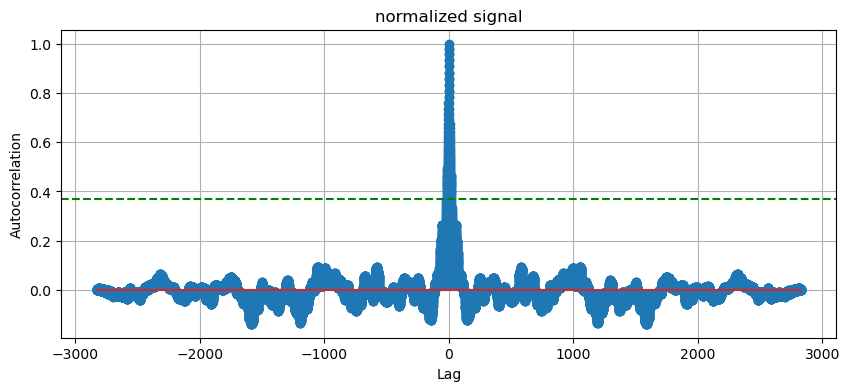

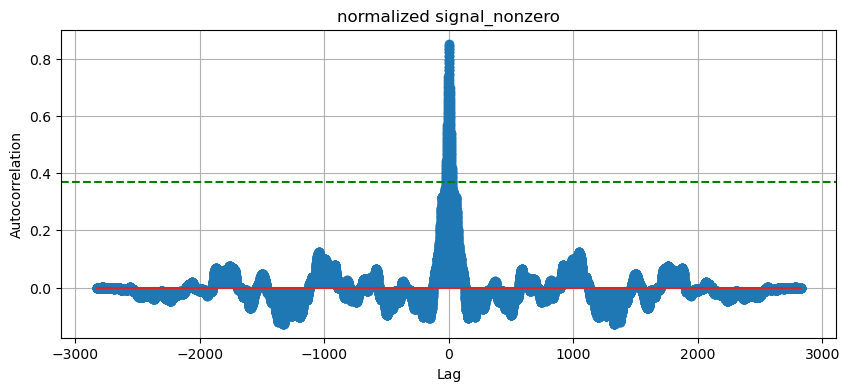

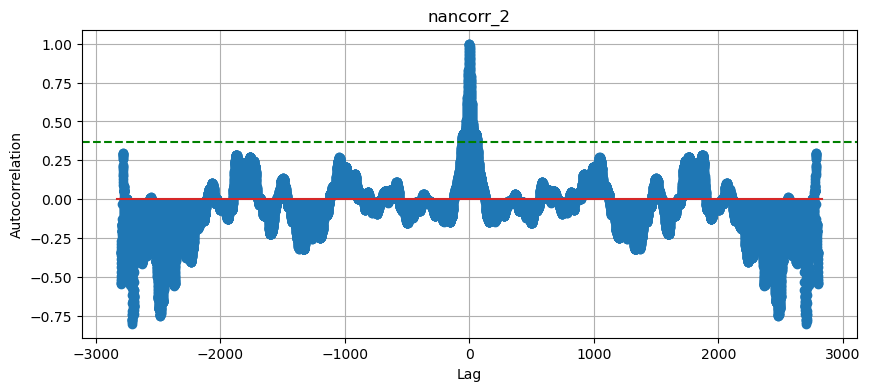

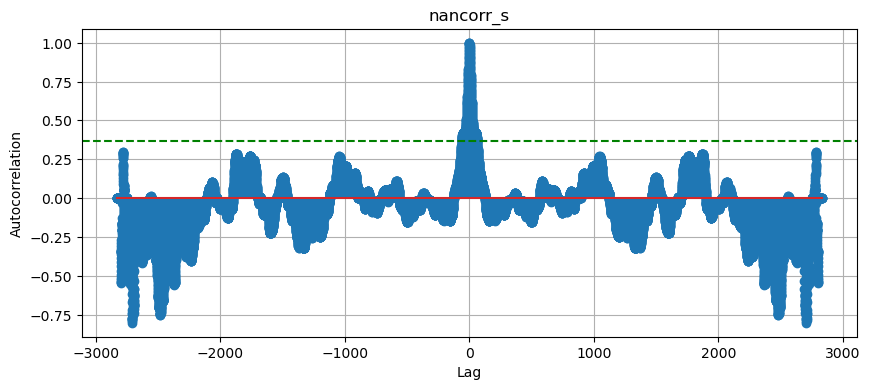

In [73]:
AllF.plot_autocorr(lags, autocorr/np.max(autocorr),titre='numpy correlate')
AllF.plot_autocorr(lags, norm_cross_corr,titre='normalized signal')
AllF.plot_autocorr(lags, norm_cross_corr_zer,titre='normalized signal_nonzero')
AllF.plot_autocorr(lags, autocorrnan_corr  ,titre='nancorr_2')
AllF.plot_autocorr(lags, autocorr_s/autocorr_s[len(x)-1]  ,titre='nancorr_s')

1.0


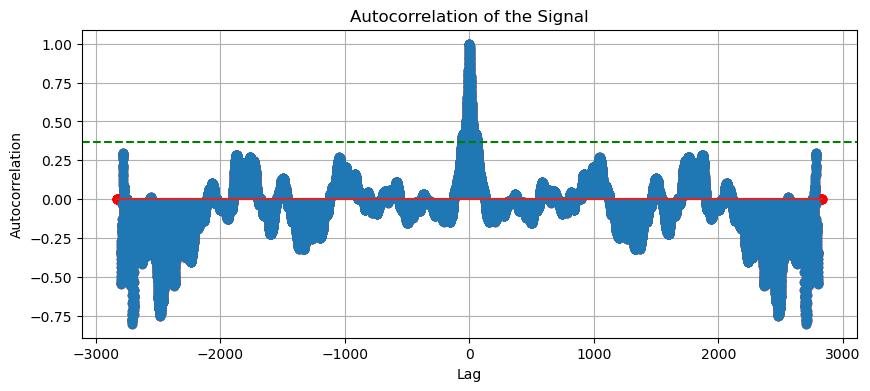

In [74]:
#plot multiple auto-correlation profiles on top of each other
plt.figure(figsize=(10,4))
plt.stem(lags,autocorr_s/autocorr_s[len(x)-1],'red')
plt.stem(lags, autocorrnan_corr)#, use_line_collection=True)
hl=1/np.e
plt.axhline(y= hl, color='green', linestyle='--')
plt.title("Autocorrelation of the Signal")
plt.xlabel("Lag")
plt.ylabel("Autocorrelation")
print(len(np.nonzero(x)[0])/L[d0])
plt.grid()
plt.show()

In [75]:
#fit an functions to autocorr
CorrFunc = copy.deepcopy(autocorrnan_corr)#which autocorrelation function to fit
thresh=100# maximum lags in seconds considered for fitting
# Generate example autocorrelation data
time = lags[len(x)-1:]

#if you want to fit oly to the beginning
valid0= np.nonzero(~np.isnan(CorrFunc[len(x)-1:]))[0]
valid = [i for i in valid0 if time[i] < thresh]
valid = np.array(valid)
time=time[:int(np.max(valid))+1]
# Fit different functions to the autocorrelation:
popt, pcov = curve_fit(Aut.exponential_decay, time[valid], CorrFunc[len(x)-1+valid], p0=[1, 20])  # Initial guess for A and tau_0
fitted_A, fitted_tau_0 = popt
popt2, pcov = curve_fit(Aut.exponential1_decay, time[valid], CorrFunc[len(x)-1+valid], p0=[20])  # Initial guess for tau_0
popt_gauss, pcov5 = curve_fit(Aut.gaussian_decay, time[valid], CorrFunc[len(x)-1+valid], p0=[1, 20])
gauss1, gauss0 = popt_gauss
popt_stretch, pcov3 = curve_fit(Aut.stretched_exponential_decay, time[valid],
                                    CorrFunc[len(x)-1+valid], p0=[1, 20, 1],maxfev=5000)
se2,se0,se1= popt_stretch

popt_power, pcov4 = curve_fit(Aut.power_law_decay, time[valid], CorrFunc[len(x)-1+valid], p0=[1, 1, 1],bounds=([0, 0, 0],                                                                                     [np.inf, np.inf, np.inf]),maxfev=5000)
power_law2, power_law0, power_law1= popt_power

popt_double, pcov2 = curve_fit(Aut.double_exponential_decay, time[valid], CorrFunc[len(x)-1+valid], p0=[1, 20, 1, 1],maxfev=5000)
de2,de0,de3,de10= popt_double


print(f"Fitted Amplitude (A): {fitted_A:.3f}")
print(f"Fitted Time Constant (tau_0): {fitted_tau_0:.3f}")



Fitted Amplitude (A): 0.921
Fitted Time Constant (tau_0): 52.193


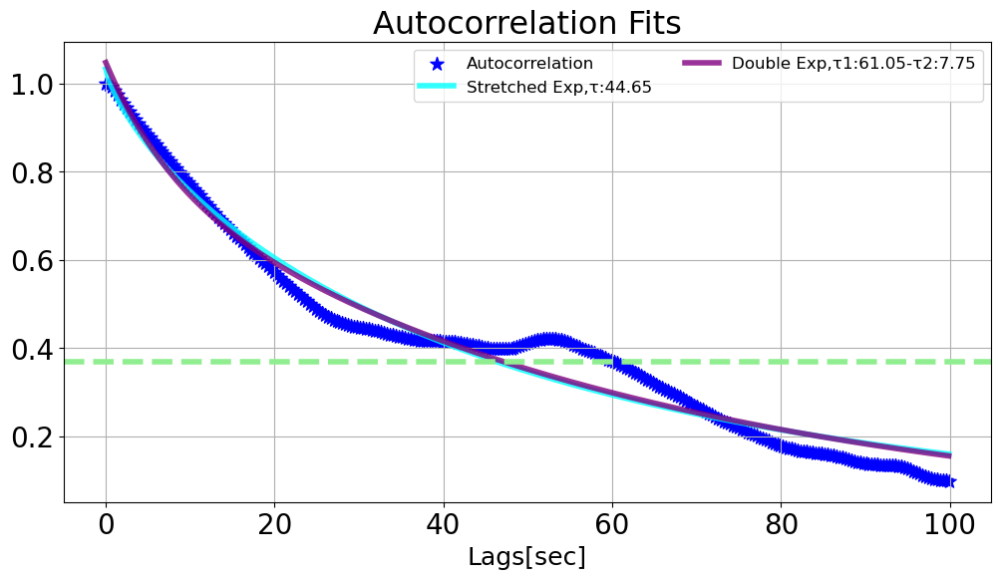

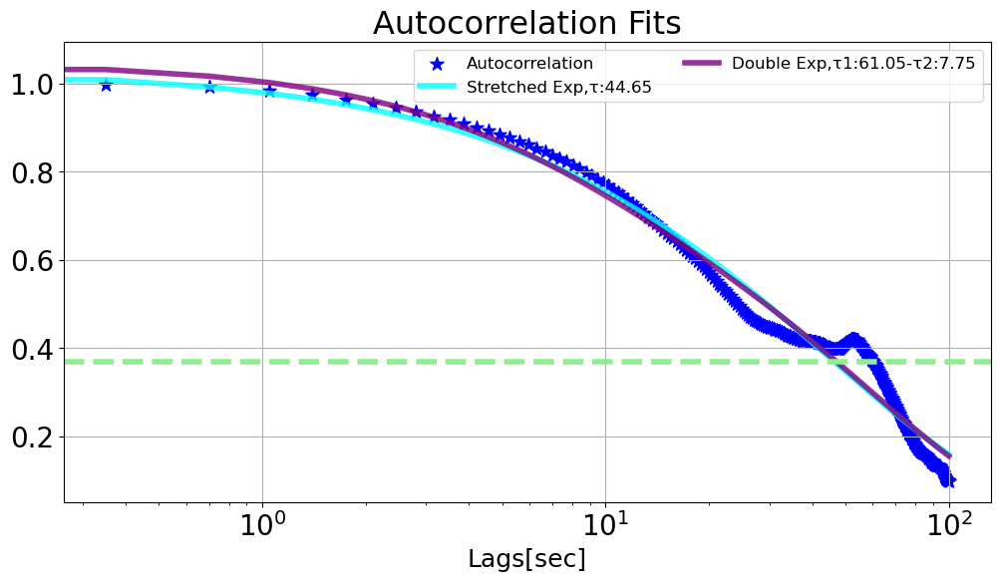

In [76]:
# Plot the autocorrelations with multiple fits
fs=20
lwidth = 4
al=0.8
loglable = ['','log']
for lo in range(2):
    fig = plt.figure(figsize=(12,6))
    plt.scatter(time[valid], CorrFunc[len(x)-1+valid], label="Autocorrelation", color="blue",s=100,marker='*')
    plt.plot(time, Aut.exponential_decay(time, *popt), label=f"Exp,τ:{fitted_tau_0:.2f}", color="red",lw=lwidth,alpha = al)
    plt.plot(time, Aut.exponential1_decay(time, *popt2), label=f"Exp1,τ:{float(popt2):.2f}", color="green",lw=lwidth,alpha = al)
    plt.plot(time, Aut.gaussian_decay(time, *popt_gauss), label=f"Gaussian,τ:{gauss0:.2f}", color="orange",lw=lwidth,alpha = al)
    plt.plot(time, Aut.stretched_exponential_decay(time, *popt_stretch), label=f"Stretched Exp,τ:{se0:.2f}", color="cyan",lw=lwidth,alpha = al)
    plt.plot(time, Aut.power_law_decay(time, *popt_power), label=f"Power law,τ:{power_law0:.2f}", color="magenta",lw=lwidth,alpha = al)
    plt.plot(time, np.array(Aut.double_exponential_decay(time, *popt_double)), label=f"Double Exp,τ1:{de0:.2f}-τ2:{de10:.2f}",
             color="purple",lw=lwidth,alpha = al)
    plt.xlabel("Lags[sec]",fontsize=fs-2)
    
    if lo:
        plt.xscale('log')   # log x-axis
    #plt.yscale('log')   # log y-axis
    plt.xticks(fontsize=fs,rotation=0)
    hl=1/np.e
    plt.axhline(y= hl, color='lightgreen', linestyle='--',lw=lwidth)
    plt.yticks(fontsize=fs)
    plt.title("Autocorrelation Fits",fontsize=fs+3)
    plt.legend(ncol=2, fontsize='large')
    plt.grid()
    fig.savefig(f"{outDir}SingleAutoCorr0_W{d0}_n{n}_exponly100all{loglable[lo]}.pdf", dpi=res, bbox_inches='tight')
    fig.savefig(f"{outDir}SingleAutoCorr_W{d0}_n{n}_exponly100alll{loglable[lo]}.png", dpi=res, bbox_inches='tight')
    plt.show()

## Plot different autocorrelations for different stretches -  not necessary for thesis plots 

In [ ]:
importlib.reload(Aut)
RR = 100
d0=5
n=2
x= copy.deepcopy(MegaData0[d0,:L[d0],n])
start_indices,end_indices = AllF.get_nonzero_start_end_long(x,thresh=3)
stretches =[(start_indices[i],end_indices[i]) for i in  range(len(start_indices))]
final_matrix,total_weight = Aut.averaging_crosscorr_diff_stretches(x,x,stretches,threshold=RR)
lags0 = np.arange(-RR + 1, RR)
lags0[:RR] = -MegaData0[d0,:RR,12][::-1]
lags0[RR:] = MegaData0[d0,1:RR,12]

In [ ]:
for g in range(final_matrix.shape[0]):
    AllF.plot_autocorr(lags0, final_matrix[g,:-1])

In [ ]:
d=5
n=4
x= copy.deepcopy(MegaData0[d,:L[d],n])
x[x==0]= np.nan
autocorrnan2,lagsnan2 = Aut.nan_correlate2(x,x)#correlate(x, x, mode='full', method='auto')
lags = np.arange(-len(x) + 1, len(x))

lags[:len(x)] = -MegaData0[d0,:L[d0],12][::-1]
lags[len(x):] = MegaData0[d0,1:L[d0],12]
AllF.plot_autocorr(lagsnan2, autocorrnan2)
AllF.plot_autocorr(lags, autocorrnan2)

# Neurons Autocorrelations

In [12]:
numW=7
num_neu = 7
WormLabel = ['W0','W1','W2','W3','W4','W5','W6']
Neur_lab = ["RIAL","RIAR","RIML","RIMR","RIBL","RIBR",'Sens.']

## Try autocorrelation on different versions of the data (smoothed, gap-filled, interpolated, ...)
### the last one, raw data, is the one used for plots mostly

In [13]:
importlib.reload(Aut)
lim=100
# compute autocorr and time constants for interpolated,raw, and gap-filled dataset
FullLags,FullAutocorr,Time_constant,exp1,gaussian,threshTimes,de = Aut.get_time_scale(MegaData_interp[:numW,:,:num_neu],L,MegaData0[:numW,:,12])
FullLags_0,FullAutocorr_0,Time_constant_0,exp1_0,gaussian_0,threshTimes_0,de_0 = Aut.get_time_scale(MegaData0[:numW,:,:num_neu],L,MegaData0[:numW,:,12])
FullLags_f,FullAutocorr_f,Time_constant_f,exp1_f,gaussian_f,threshTimes_f,de_f = Aut.get_time_scale(MegaData_filled[:numW,:,:num_neu],L,MegaData0[:numW,:,12])
#compute time constants for different fitting curves on raw data's autocorrelation, compute fits for first lim seconds
FullLags_a,FullAutocorr_a,Time_constant_a,exp1_a,gaussian_a,stretched_exponential_a,power_law_a,threshTimes_a,de_a = Aut.get_time_scale(MegaData0[:numW,:,:num_neu],
                                            L,MegaData0[:numW,:,12],allfit=True,thresh=lim)

/Users/mahsa/Documents/phd-thesis-code/Plotting/Functions/Autocorr.py:99: RuntimeWarning: overflow encountered in exp
  return A1 * np.exp(-tau / tau1) + A2 * np.exp(-tau / tau2)
/Users/mahsa/miniconda3/envs/Targettrack/lib/python3.8/site-packages/scipy/optimize/_minpack_py.py:906: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
/Users/mahsa/Documents/phd-thesis-code/Plotting/Functions/Autocorr.py:102: RuntimeWarning: divide by zero encountered in power
  return A * np.exp(-((tau / tau0) ** beta))
/Users/mahsa/Documents/phd-thesis-code/Plotting/Functions/Autocorr.py:102: RuntimeWarning: invalid value encountered in power
  return A * np.exp(-((tau / tau0) ** beta))


In [16]:
WormLabel = ['W0','W1','W2','W3','W4','W5','W6']
Neur_lab = ["RIAL","RIAR","RIML","RIMR","RIBL","RIBR",'Sens.']

### Plot sample autocorrelation plots for single neuron

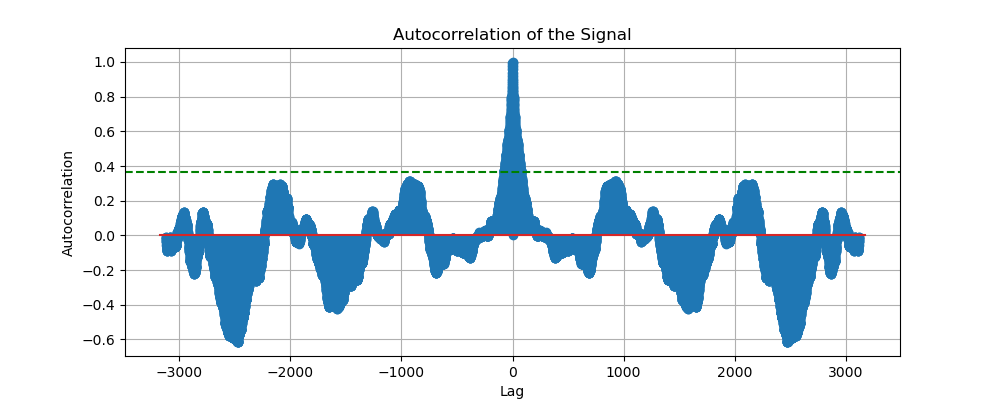

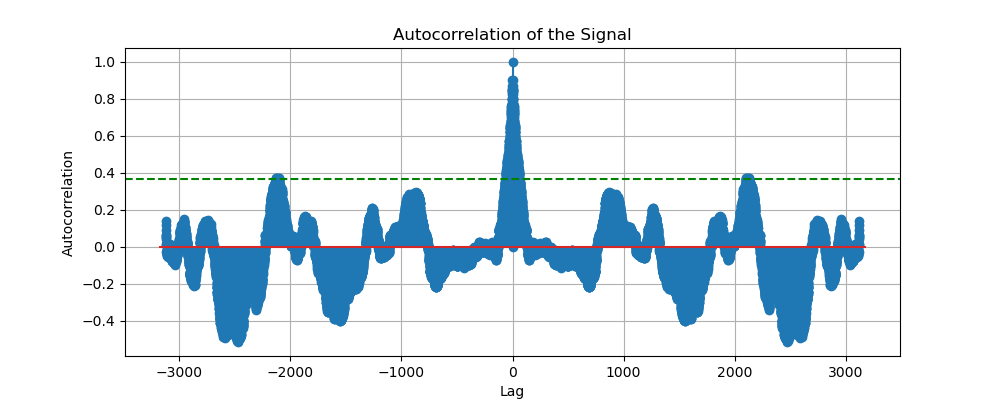

In [74]:
d0=5# number of worm
n0=4#number of neuron
fig = Aut.plot_autocorr(FullLags[d0,:2*L[d0],n0], FullAutocorr[d0,:2*L[d0],n0])# interpolated data
fig = Aut.plot_autocorr(FullLags_a[d0,:2*L[d0],n0], FullAutocorr_a[d0,:2*L[d0],n0]) # raw data

### plot AutoCorr with exponential fit - interpolated data

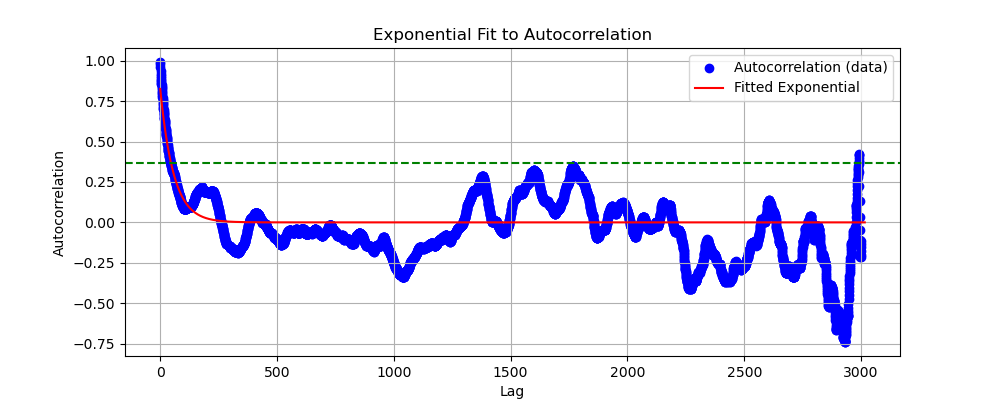

In [75]:
n,d = 4,3
plt.figure(figsize=(10,4))
temp = FullLags[d,L[d]:2*L[d]-1,n]
autocorr = FullAutocorr[d,L[d]:2*L[d]-1,n]
popt2 = Time_constant_a[d,n,1], Time_constant_a[d,n,0] 
plt.scatter(temp, autocorr, label="Autocorrelation (data)", color="blue")
plt.plot(temp, Aut.exponential_decay(temp, *popt2), label="Fitted Exponential", color="red")
plt.xlabel("Lag")
plt.ylabel("Autocorrelation")
plt.title("Exponential Fit to Autocorrelation")
hl=1/np.e
plt.axhline(y= hl, color='green', linestyle='--')#, label='y = 1.96')
plt.legend()
plt.grid()
plt.show()

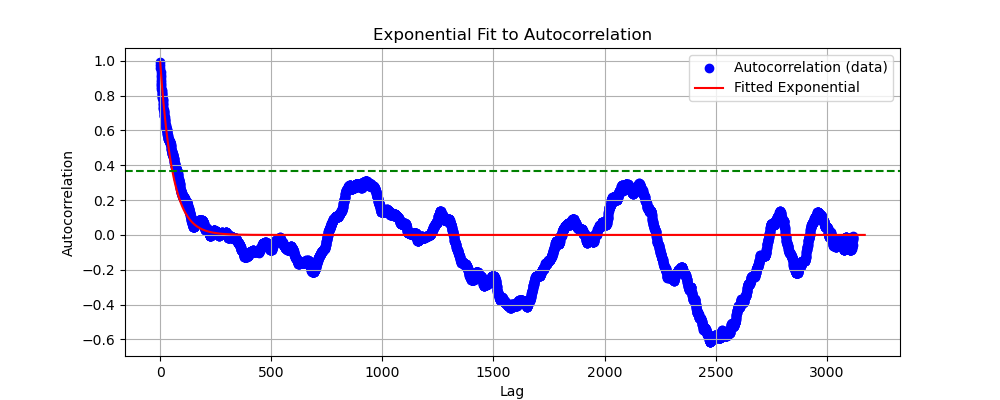

In [76]:
n,d = 4,5
fig = plt.figure(figsize=(10,4))
temp = FullLags[d,L[d]:2*L[d]-1,n]
autocorr = FullAutocorr[d,L[d]:2*L[d]-1,n]
popt = exp1_a[d,n], 
plt.scatter(temp, autocorr, label="Autocorrelation (data)", color="blue")
plt.plot(temp, Aut.exponential1_decay(temp, *popt), label="Fitted Exponential", color="red")
plt.xlabel("Lag")
plt.ylabel("Autocorrelation")
plt.title("Exponential Fit to Autocorrelation")
hl=1/np.e
plt.axhline(y= hl, color='green', linestyle='--')#, label='y = 1.96')
plt.legend()
plt.grid()
plt.show()

### Plot average time scales as bar plots - raw data
100 sec lag used for fitting, except for threshold time scales

In [16]:
refine = ''

In [19]:
# exclude third worms RIB and RIM
refine = '_good'
exp1_a[2,2:6]= np.nan
threshTimes_a[2,2:6]= np.nan
de_a[2,2:6]= np.nan
de_a[de_a>2000] = np.nan
stretched_exponential_a[2,2:6]= np.nan

101


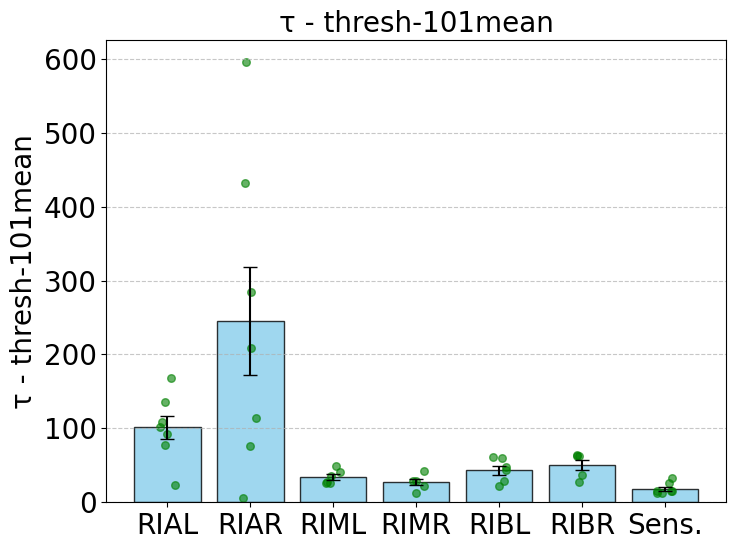

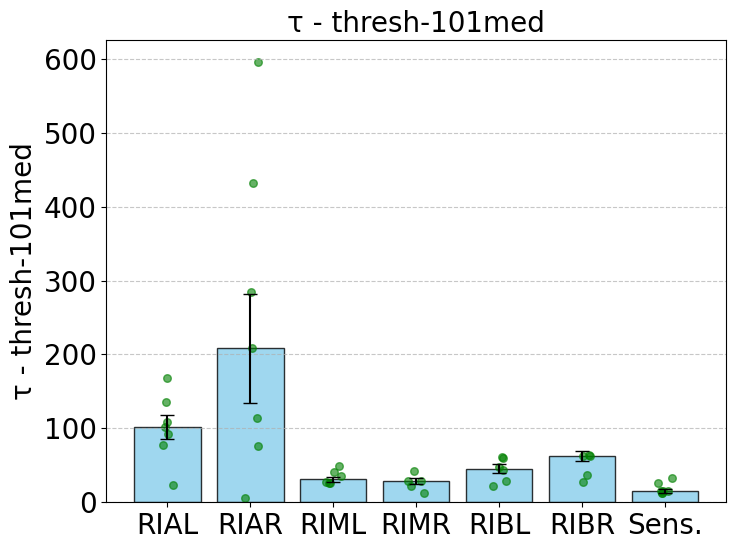

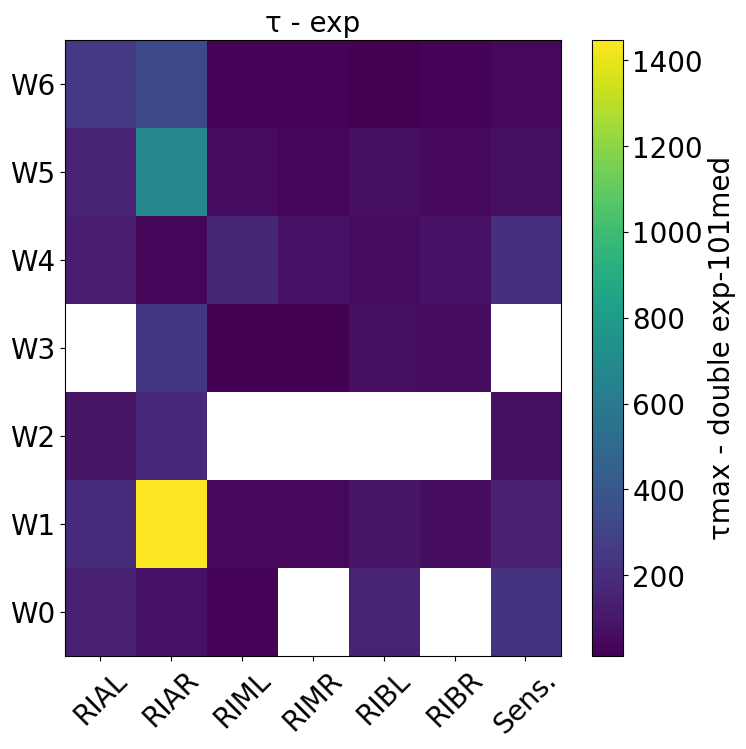

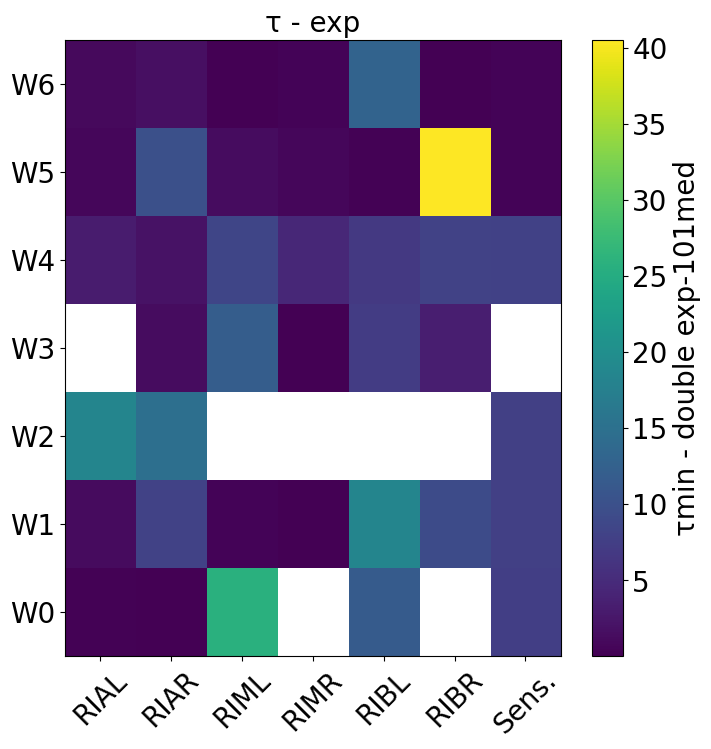

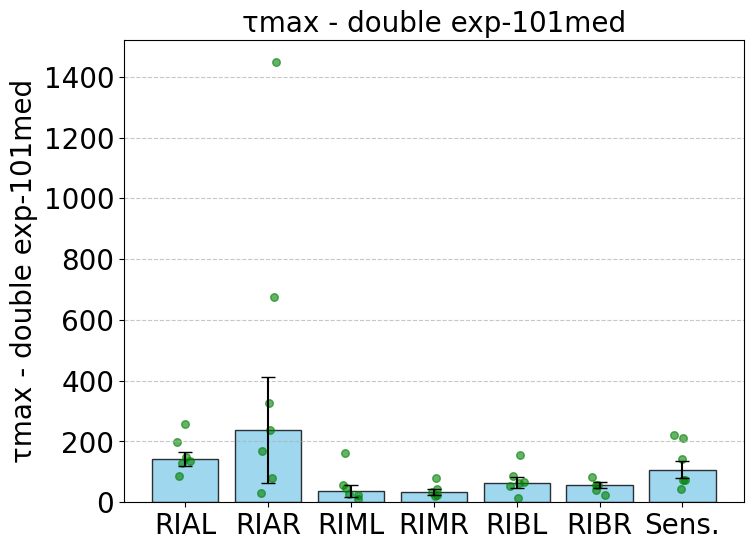

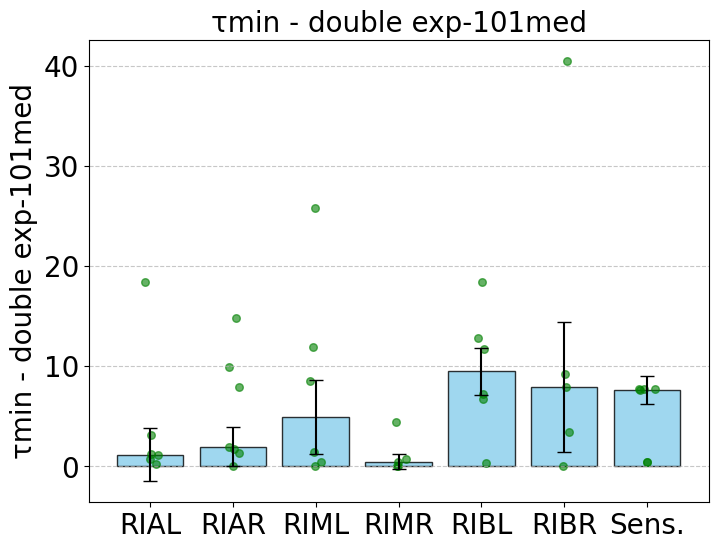

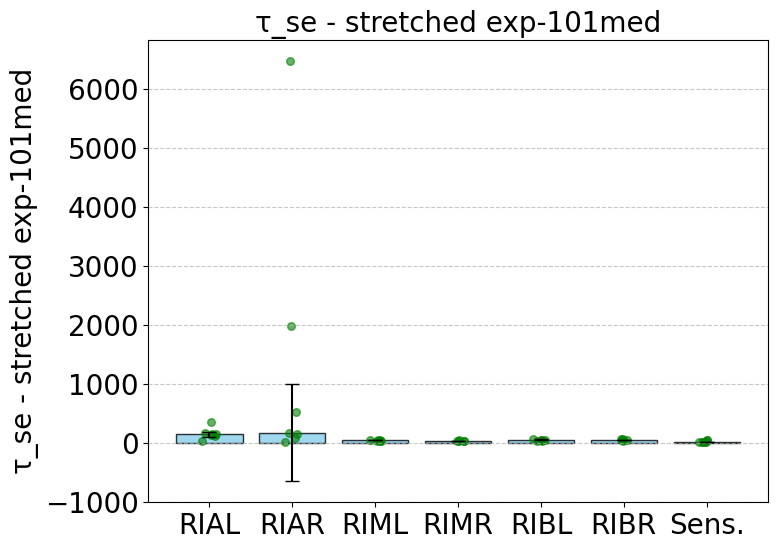

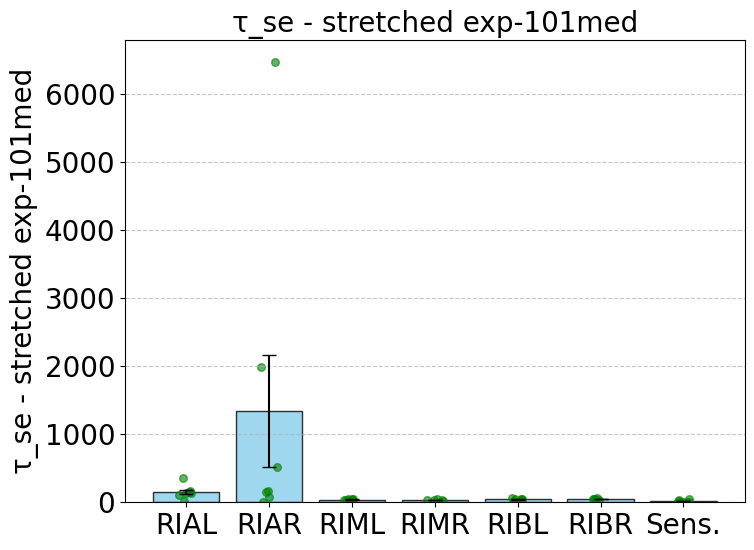

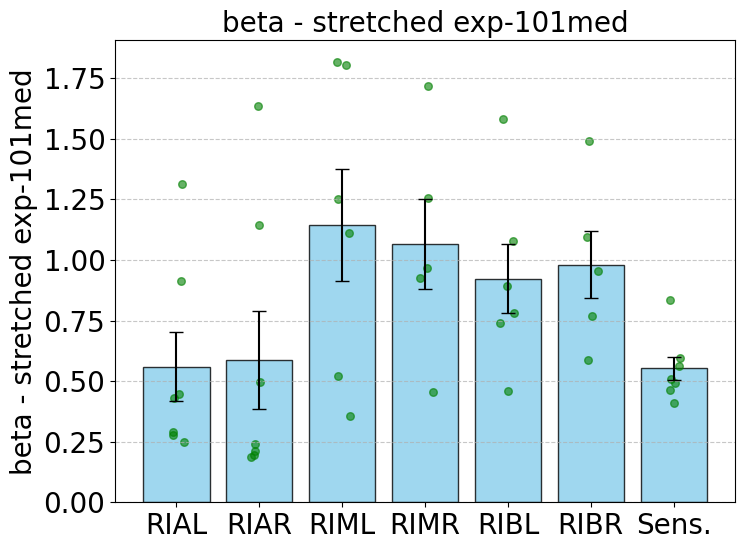

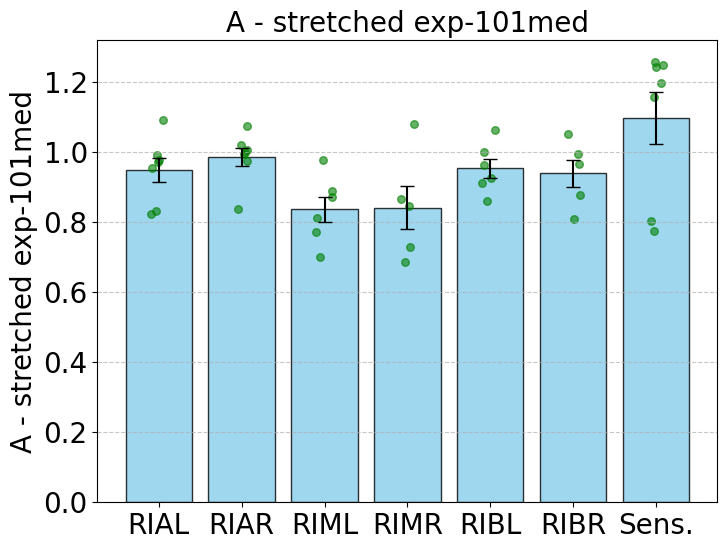

In [110]:
importlib.reload(Aut)

dot=1

# plot time of passing 1/e threshold
fig = Aut.plot_parameters_bar(threshTimes_a,Neur_lab[:num_neu], paramName=f'τ - thresh-{lim}mean',fs = 20,dots=dot)
fig.savefig(f"{outDir}ave_tau_thresh_bar_mean{lim}.pdf", dpi=res, bbox_inches='tight')
fig.savefig(f"{outDir}ave_tau_thresh_bar_mean{lim}{refine}dot{dot}.png", dpi=res, bbox_inches='tight')
fig = Aut.plot_parameters_bar(threshTimes_a,Neur_lab[:num_neu], paramName=f'τ - thresh-{lim}med',fs = 20,median=1,dots=dot)
fig.savefig(f"{outDir}ave_tau_thresh_bar_med{lim}.pdf", dpi=res, bbox_inches='tight')
fig.savefig(f"{outDir}ave_tau_thresh_bar_med{lim}{refine}dot{dot}.png", dpi=res, bbox_inches='tight')

# plot min and max time scales of double exponential fits
fig = Aut.plot_parameters_heat(np.max(de_a[[0,1,2,3,4,5,6],:,:2],axis=2),Neur_lab[:num_neu],['W0','W1','W2','W3','W4','W5','W6'] ,
                               paramName=f'τmax - double exp-{lim}med',fs = 20,median=1)
fig = Aut.plot_parameters_heat(np.min(de_a[[0,1,2,3,4,5,6],:,:2],axis=2),Neur_lab[:num_neu],['W0','W1','W2','W3','W4','W5','W6'] ,
                               paramName=f'τmin - double exp-{lim}med',fs = 20,median=1)
fig = Aut.plot_parameters_bar(np.max(de_a[[0,1,2,3,4,5,6],:,:2],axis=2),Neur_lab[:num_neu],
                               paramName=f'τmax - double exp-{lim}med',fs = 20,median=1,dots=dot)
fig.savefig(f"{outDir}ave_taumax_doubleExp_bar_med{lim}{refine}dot{dot}.png", dpi=res, bbox_inches='tight')
fig = Aut.plot_parameters_bar(np.min(de_a[[0,1,2,3,4,5,6],:,:2],axis=2),Neur_lab[:num_neu],
                               paramName=f'τmin - double exp-{lim}med',fs = 20,median=1,dots=dot)
fig.savefig(f"{outDir}ave_tau_doubleExp_bar_med{lim}.pdf", dpi=res, bbox_inches='tight')
fig.savefig(f"{outDir}ave_taumin_doubleExp_bar_med{lim}{refine}dot{dot}.png", dpi=res, bbox_inches='tight')
# plot time scales of stretched exponential fits
fig = Aut.plot_parameters_bar(stretched_exponential_a[:,:,0],Neur_lab[:num_neu],
                               paramName=f'τ_se - stretched exp-{lim}med',fs = 20,median=1,dots=dot)
fig.savefig(f"{outDir}ave_tau_strExp_bar_med{lim}.pdf", dpi=res, bbox_inches='tight')
fig.savefig(f"{outDir}ave_tau_strExp_bar_med{lim}{refine}dot{dot}.png", dpi=res, bbox_inches='tight')
fig = Aut.plot_parameters_bar(stretched_exponential_a[:,:,0],Neur_lab[:num_neu],
                               paramName=f'τ_se - stretched exp-{lim}med',fs = 20,dots=dot)
fig.savefig(f"{outDir}ave_tau_strExp_bar_mean{lim}.pdf", dpi=res, bbox_inches='tight')
fig.savefig(f"{outDir}ave_tau_strExp_bar_mean{lim}{refine}dot{dot}.png", dpi=res, bbox_inches='tight')

fig = Aut.plot_parameters_bar(stretched_exponential_a[:,:,1],Neur_lab[:num_neu],
                               paramName=f'beta - stretched exp-{lim}med',fs = 20,median=0,dots=dot)
fig.savefig(f"{outDir}ave_tau_strExp_bar_mean{lim}.pdf", dpi=res, bbox_inches='tight')
fig.savefig(f"{outDir}ave_beta_strExp_bar_mean{lim}{refine}dot{dot}.png", dpi=res, bbox_inches='tight')

fig = Aut.plot_parameters_bar(stretched_exponential_a[:,:,2],Neur_lab[:num_neu],
                               paramName=f'A - stretched exp-{lim}med',fs = 20,median=0,dots=dot)
fig.savefig(f"{outDir}ave_tau_strExp_bar_mean{lim}.pdf", dpi=res, bbox_inches='tight')
fig.savefig(f"{outDir}ave_A_strExp_bar_mean{lim}{refine}dot{dot}.png", dpi=res, bbox_inches='tight')

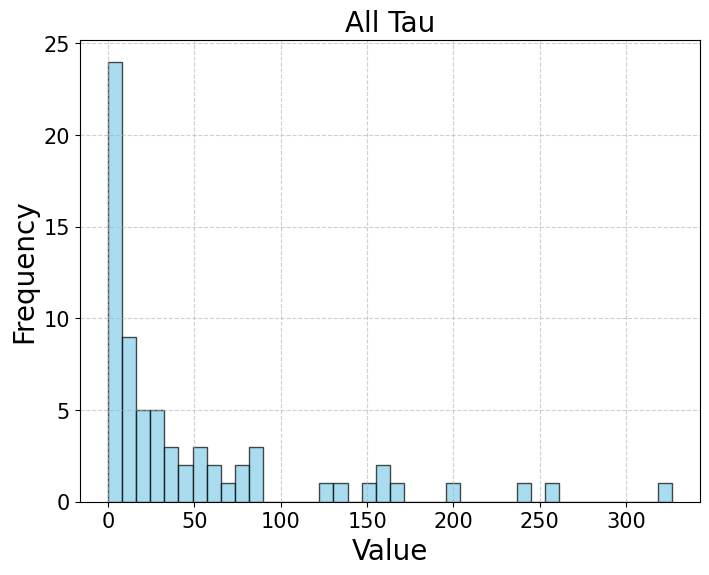

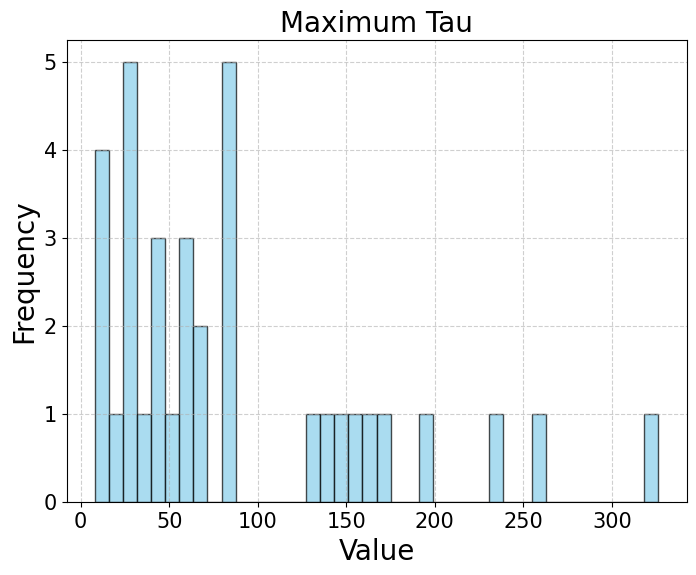

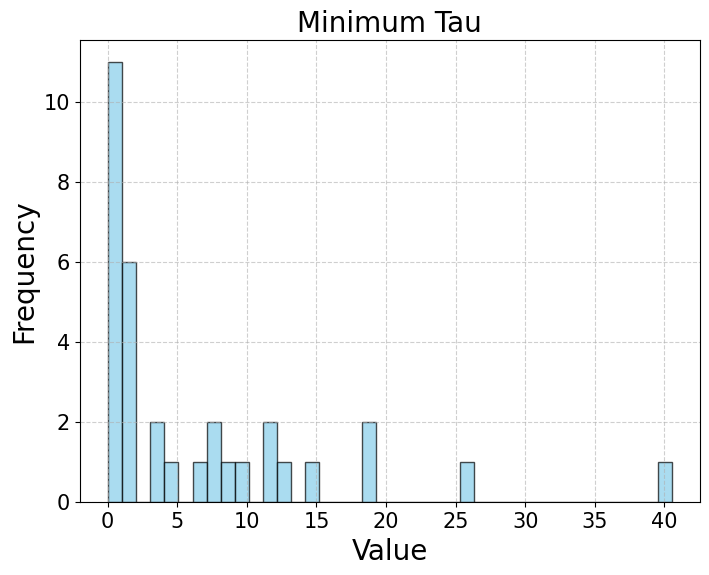

In [21]:
# double exponential time scales distribution - histogram
data = de_a[:,:6,:2]
data[data>600]=0
fighistAll = AllF.plot_hist_all(data,b=40,titre='All Tau')
datamax = np.max(de_a[:,:6,:2],axis=2)
data[data>600]=0
fighistMax = AllF.plot_hist_all(datamax,b=40,titre='Maximum Tau')
datamin = np.min(de_a[:,:6,:2],axis=2)
data[data>600]=0
fighistMin = AllF.plot_hist_all(datamin,b=40,titre='Minimum Tau')
for form in ['.png','.pdf']:
    fighistMax.savefig(f"{outDir}Hist_Exp2_tauMax_barInterNuc_{lim}{refine}2{form}", dpi=res, bbox_inches='tight')
    fighistMin.savefig(f"{outDir}Hist_Exp2_tauMin_barInterNuc_{lim}{refine}2{form}", dpi=res, bbox_inches='tight')
    fighistAll.savefig(f"{outDir}Hist_Exp2_tauAll_barInterNuc_{lim}{refine}2{form}", dpi=res, bbox_inches='tight')

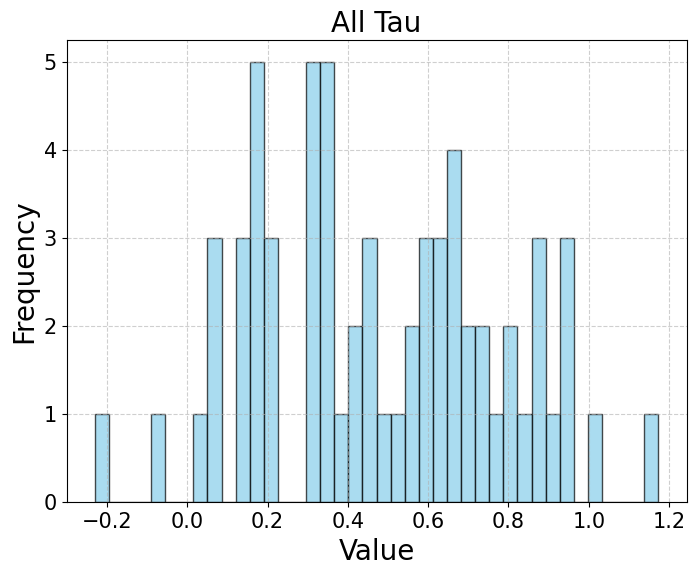

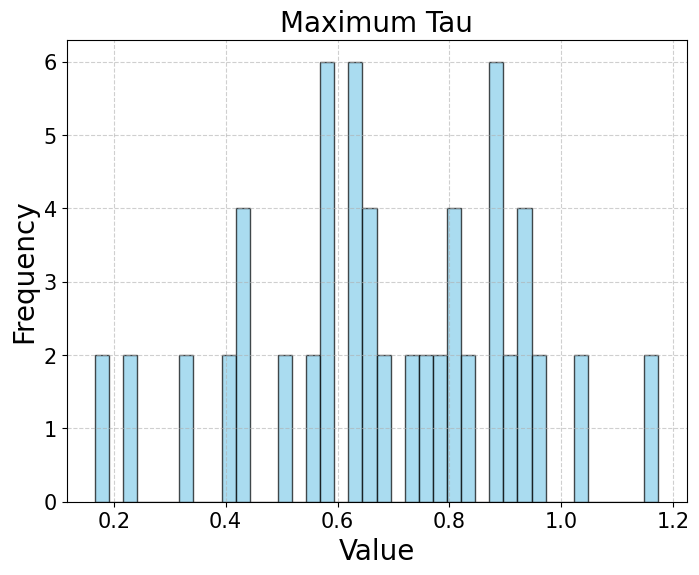

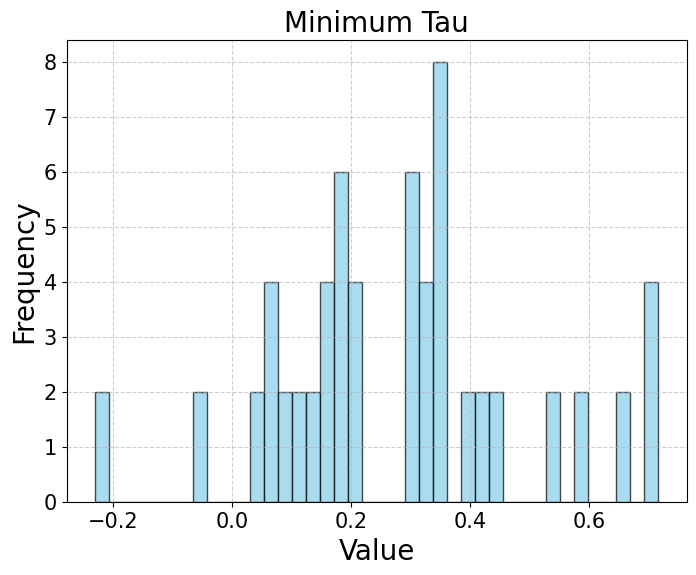

In [34]:

importlib.reload(AllF)
data = de_a[:,:6,2:4]
data[data>50]=0
data[data<-40]=0
fighistAll = AllF.plot_hist_all(data,b=40,titre='All Tau')
datamax0 = de_a[:,:6,2:4]
datamax = copy.deepcopy(datamax0)
datamax_arg = np.argmax(de_a[:,:6,:2],axis=2)
for i in range(datamax0.shape[0]):
    for j in range(datamax0.shape[1]):
        datamax[i,j] = datamax0[i,j,datamax_arg[i,j]]
datamax[datamax>50]=0
fighistMax = AllF.plot_hist_all(datamax,b=40,titre='Maximum Tau')
datamin_arg = np.argmin(de_a[:,:6,:2],axis=2)
datamin = copy.deepcopy(datamax0)
for i in range(datamax0.shape[0]):
    for j in range(datamax0.shape[1]):
        datamin[i,j] = datamax0[i,j,datamin_arg[i,j]]
#datamin = np.min(de_b[:,:,:2],axis=2)
datamin[datamin<-45]=0
fighistMin = AllF.plot_hist_all(datamin,b=40,titre='Minimum Tau')
for form in ['.png','.pdf']:
    fighistMax.savefig(f"{outDir}Neuron_Hist_Exp2_AMax_barInterNuc_{lim}{refine}{form}", dpi=res, bbox_inches='tight')
    fighistMin.savefig(f"{outDir}Neuron_Hist_Exp2_AMin_barInterNuc_{lim}{refine}{form}", dpi=res, bbox_inches='tight')
    fighistAll.savefig(f"{outDir}Neuron_Hist_Exp2_AAll_barInterNuc_{lim}{refine}{form}", dpi=res, bbox_inches='tight')

In [141]:
form1 = '.png'
form2 = '.pdf'
fighistMax.savefig(f"{outDir}Hist_Exp2_tauMax_barInterNuc_{lim}{refine}{form1}", dpi=res, bbox_inches='tight')
fighistMin.savefig(f"{outDir}Hist_Exp2_tauMin_barInterNuc_{lim}{refine}{form1}", dpi=res, bbox_inches='tight')
fighistAll.savefig(f"{outDir}Hist_Exp2_tauAll_barInterNuc_{lim}{refine}{form1}", dpi=res, bbox_inches='tight')

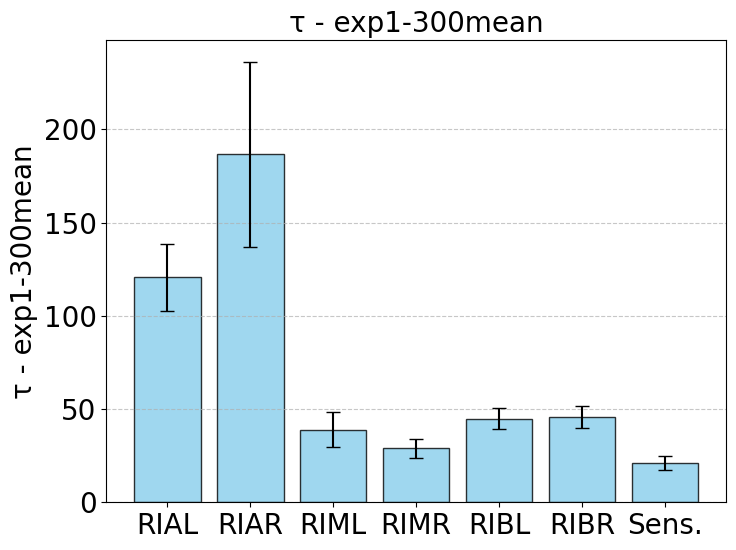

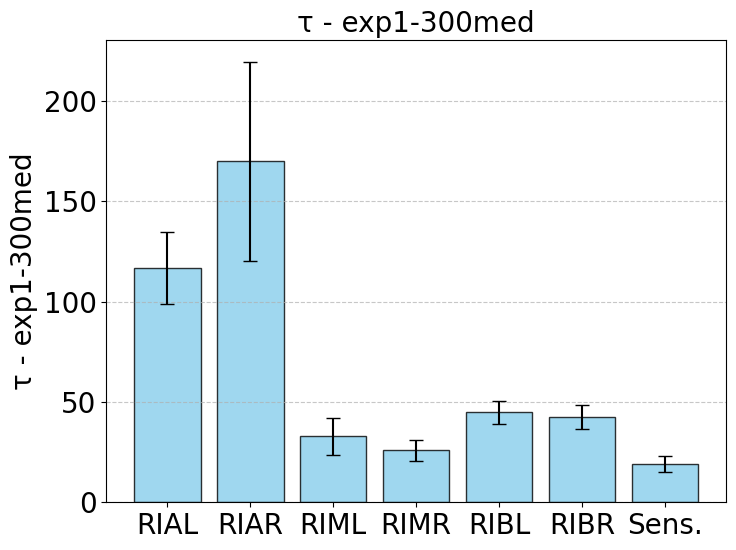

In [27]:

fig = Aut.plot_parameters_bar(exp1_a,Neur_lab[:num_neu], paramName=f'τ - exp1-{lim}mean',fs = 20)
for form in ['.png','.pdf']:
    fig.savefig(f"{outDir}ave_tau_e1_bar_mean{lim}{form}", dpi=res, bbox_inches='tight')
fig = Aut.plot_parameters_bar(exp1_a,Neur_lab[:num_neu], paramName=f'τ - exp1-{lim}med',fs = 20,median=1)
for form in ['.png','.pdf']:
    fig.savefig(f"{outDir}ave_tau_e1_bar_med{lim}{form}", dpi=res, bbox_inches='tight')


### Plot all interneurons with exponential fit - raw data

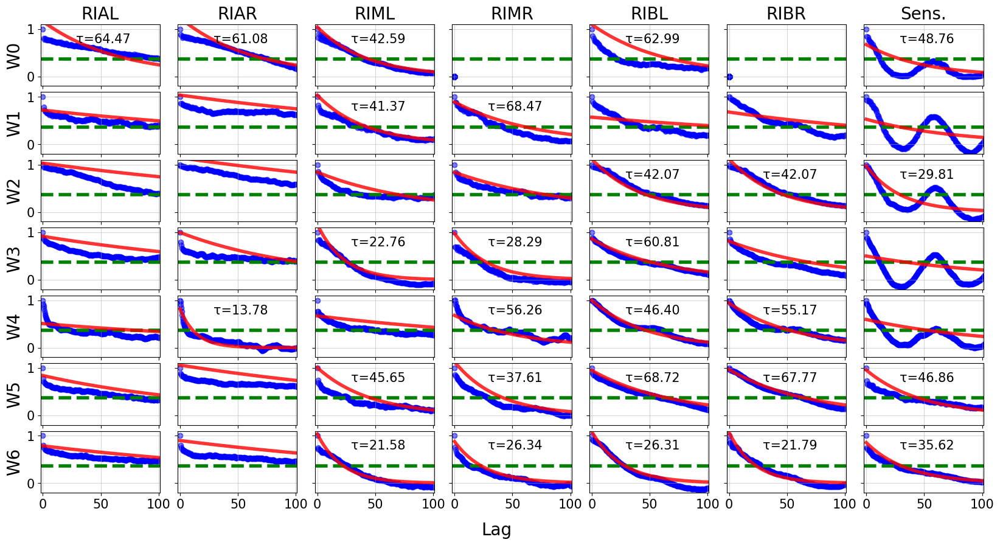

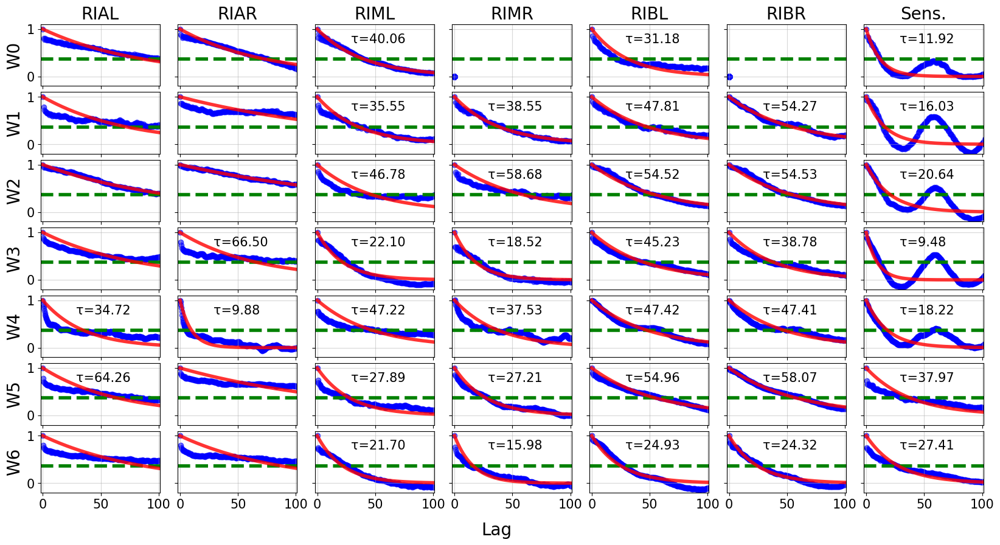

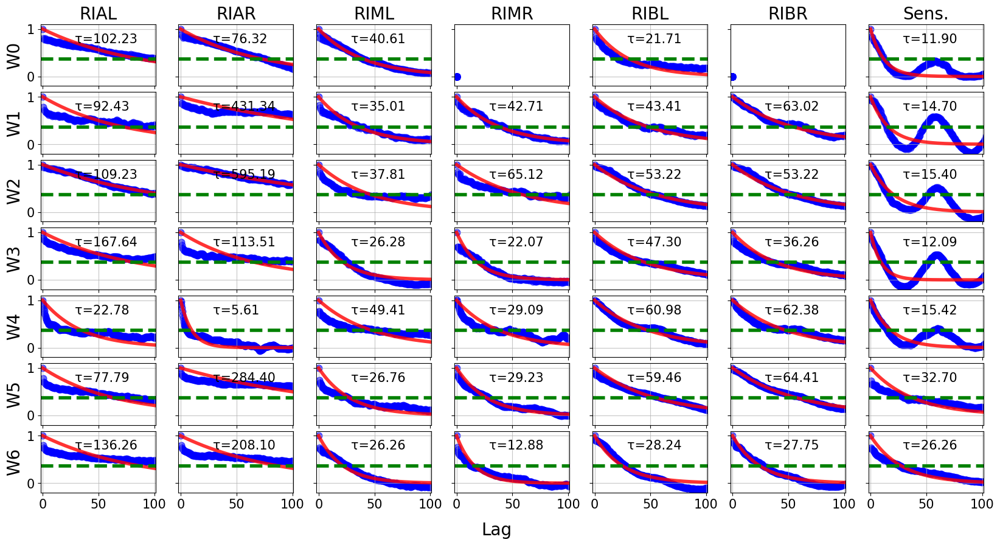

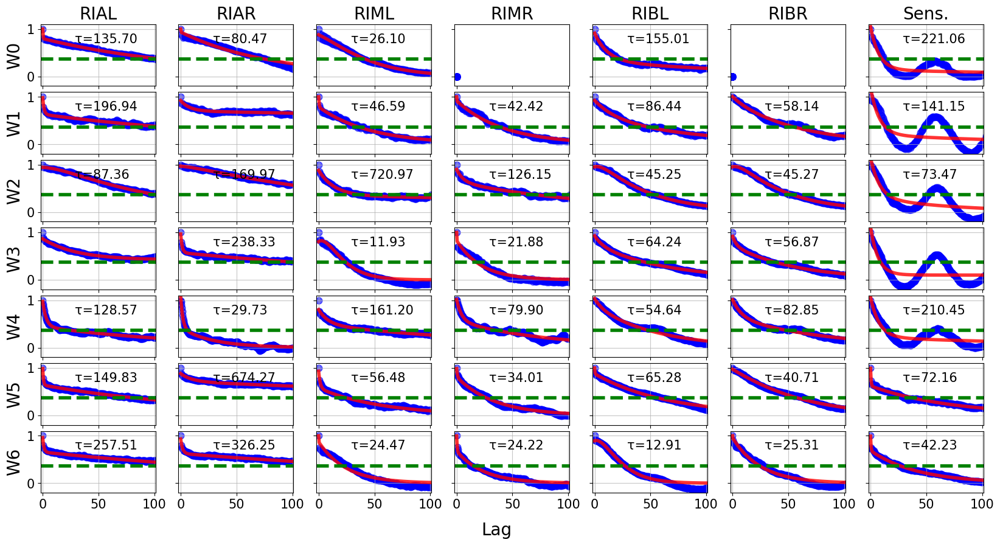

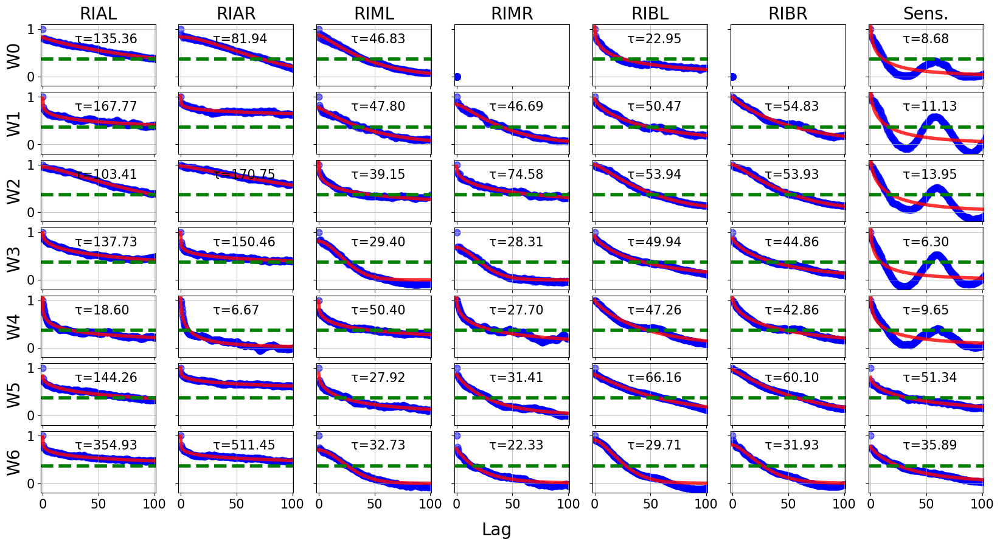

In [97]:

lim=101
fig1 = Aut.plot_AllneuronsFit(FullLags_a,FullAutocorr_a,Neur_lab[:num_neu],Time_constant,L,exp=0,limit=lim)
fig2 = Aut.plot_AllneuronsFit(FullLags_a,FullAutocorr_a,Neur_lab[:num_neu],exp1_a,L,exp=1,limit=lim)
fig3,x = Aut.plot_AllneuronsFit_thresh(FullLags_a,FullAutocorr_a,Neur_lab[:num_neu],exp1_a,threshTimes_a,L,exp=1,limit=lim)
figde,axesde = Aut.plot_AllneuronsFit_thresh(FullLags_a,FullAutocorr_a,Neur_lab[:num_neu],de_a,threshTimes_a,L,exp=2,limit=lim,writeT=1)
figse,axesse = Aut.plot_AllneuronsFit_thresh(FullLags_a,FullAutocorr_a,Neur_lab[:num_neu],
                                              stretched_exponential_a,threshTimes_a,L,exp=3,limit=lim,writeT=1)

for form in ['.png','.pdf']:
    fig1.savefig(f"{outDir}all_neuronsFit_exp{lim}{form}", dpi=res, bbox_inches='tight')
    fig2.savefig(f"{outDir}all_neuronsFit_exp1{lim}{form}", dpi=res, bbox_inches='tight')
    fig3.savefig(f"{outDir}all_neuronsFit_ex1shown_threshwritten{lim}{form}", dpi=res, bbox_inches='tight')
    figde.savefig(f"{outDir}all_neurons_doubleExpFit{lim}{form}", dpi=res, bbox_inches='tight')
    figse.savefig(f"{outDir}all_neurons_streExpFit{lim}{form}", dpi=res, bbox_inches='tight')

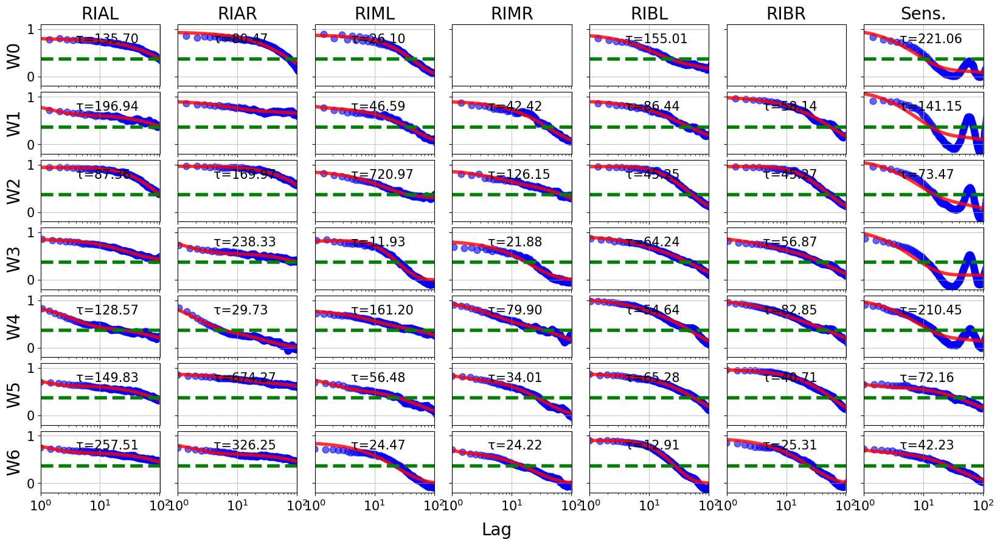

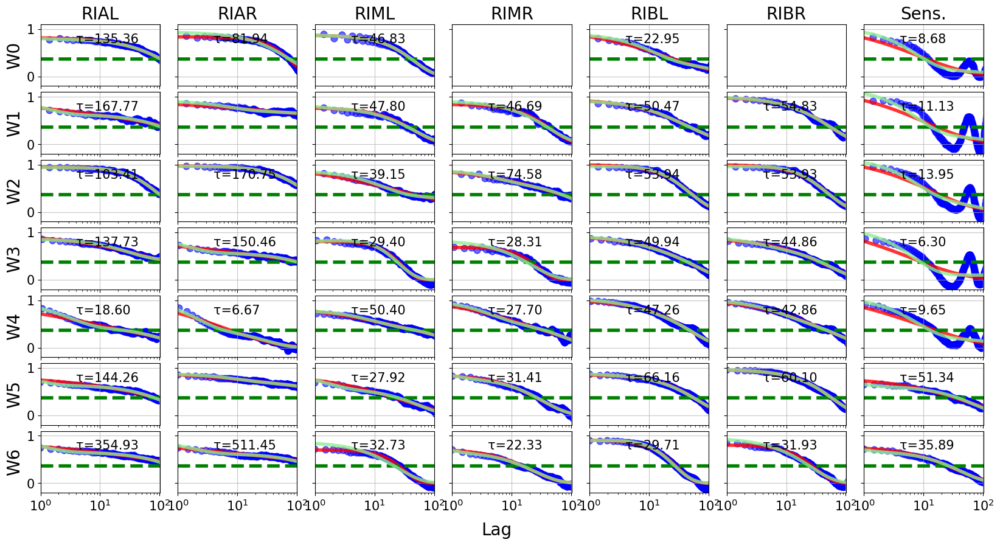

In [98]:
figde,axesde = Aut.plot_AllneuronsFit_thresh(FullLags_a,FullAutocorr_a,Neur_lab[:num_neu],de_a,
                                             threshTimes_a,L,exp=2,limit=lim,writeT=1,log=1)
figse,axesse = Aut.plot_AllneuronsFit_thresh(FullLags_a,FullAutocorr_a,Neur_lab[:num_neu],
                                              stretched_exponential_a,threshTimes_a,L,exp=3,limit=lim,writeT=1,log=1)
fig = Aut.add_to_plot_AllneuronsFit(figse,axesse,FullLags_a,de_a,L,exp=2,log=1)
for form in ['.png','.pdf']:
    figde.savefig(f"{outDir}all_neurons_doubleExpFit{lim}{form}", dpi=res, bbox_inches='tight')
    figse.savefig(f"{outDir}all_neurons_streExpFitlog{form}", dpi=res, bbox_inches='tight')

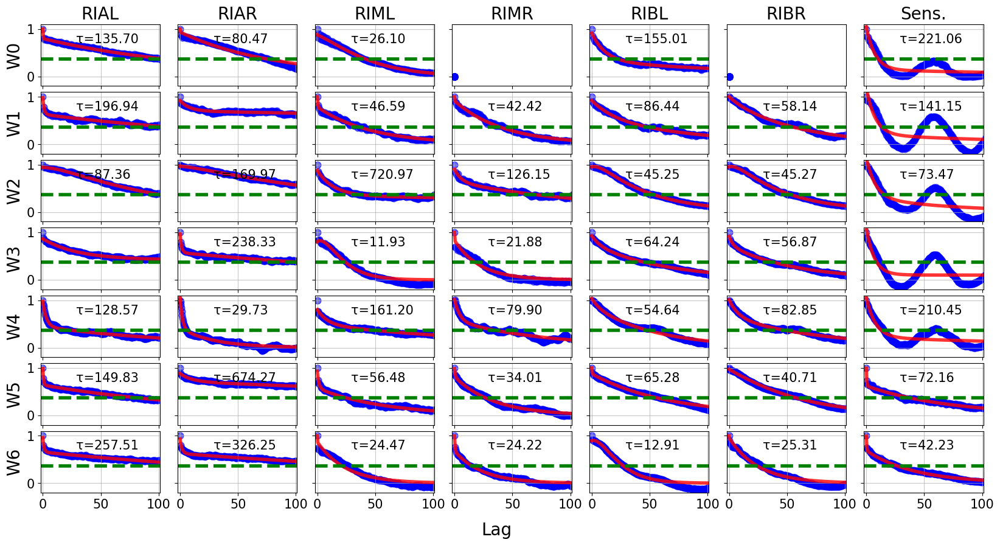

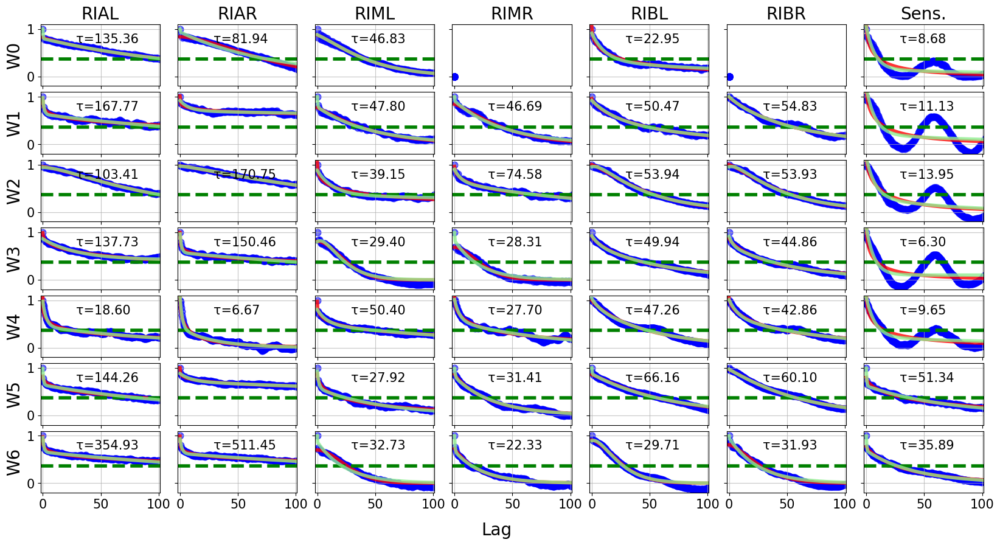

In [99]:
figde,axesde = Aut.plot_AllneuronsFit_thresh(FullLags_a,FullAutocorr_a,Neur_lab[:num_neu],de_a,
                                             threshTimes_a,L,exp=2,limit=lim,writeT=1,log=0)
figse,axesse = Aut.plot_AllneuronsFit_thresh(FullLags_a,FullAutocorr_a,Neur_lab[:num_neu],
                                              stretched_exponential_a,threshTimes_a,L,exp=3,limit=lim,writeT=1,log=0)
fig = Aut.add_to_plot_AllneuronsFit(figse,axesse,FullLags_a,de_a,L,exp=2,log=0)
for form in ['.png','.pdf']:
    figse.savefig(f"{outDir}all_neurons_streExpFit{form}", dpi=res, bbox_inches='tight')
    figde.savefig(f"{outDir}all_neurons_doubleExpFitLog0{lim}{form}", dpi=res, bbox_inches='tight')

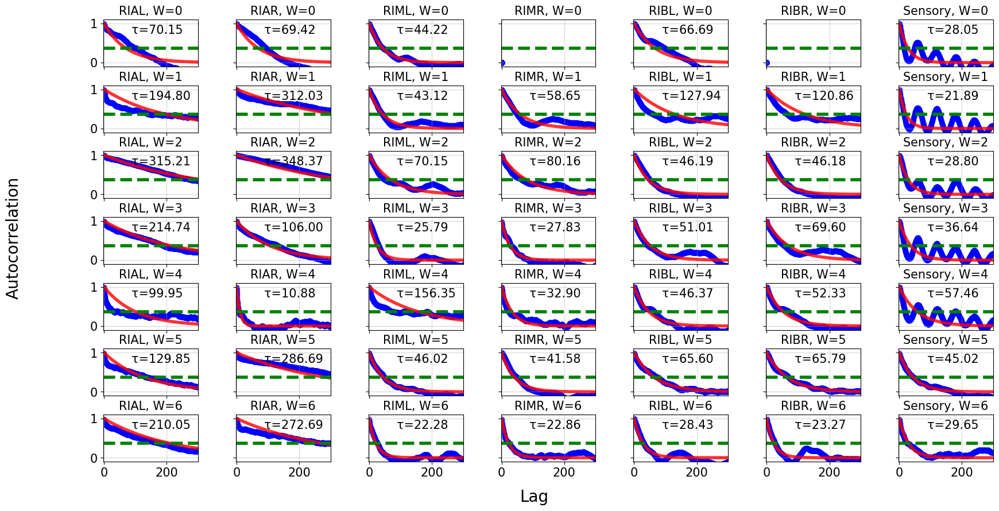

In [18]:
# Adjust figure size and create 7x7 subplots
fig, axes = plt.subplots(7, 7, figsize=(20, 10), sharex=True, sharey=True)
fig.subplots_adjust(hspace=0.4, wspace=0.4)
Neur_lab = ["RIAL","RIAR","RIML","RIMR","RIBL","RIBR",'Sensory']
# Loop over all combinations of n and d
for n in range(7):
    for d in range(7):
        ax = axes[d, n]  # Access the subplot
        
        # Extract data for current n and d
        temp = FullLags[d, L[d]:2*L[d]-1, n]
        autocorr = FullAutocorr[d, L[d]:2*L[d]-1, n]
        popt = exp1[d,n],
        
        # Plot scatter and fitted curve
        ax.scatter(temp, autocorr, label="Data", color="blue", alpha=0.6)
        ax.plot(temp, Aut.exponential1_decay(temp, *popt), label="Fit", color="red", alpha=0.8,lw=4)
        hl=1/np.e
        ax.axhline(y= hl, color='green', linestyle='--',lw=4)
        # Add titles and grid
        ax.set_title(Neur_lab[n]+f", W={d}", fontsize=15)
        ax.grid(alpha=0.5)
        ax.set_ylim(-0.1, 1.1)
        ax.set_xlim(-2,right= 300)
        tau_value = exp1[d, n]
        if ~np.isnan(tau_value):
            ax.text(0.3, 0.7, f"τ={tau_value:.2f}", transform=ax.transAxes, fontsize=15, color="black")
        # Remove ticks for better readability
        ax.tick_params(axis='both', which='major', labelsize=15)

# Set shared labels
fig.text(0.5, 0.04, 'Lag', ha='center', fontsize=20)
fig.text(0.04, 0.5, 'Autocorrelation', va='center', rotation='vertical', fontsize=20)
fig.savefig(f"{outDir}all_neuronsFit_interpolated_exp1.pdf", dpi=res, bbox_inches='tight')
fig.savefig(f"{outDir}all_neuronsFit_interpolated_exp1.png", dpi=res, bbox_inches='tight')
plt.show()

# Test time scales of neurites Only

In [32]:
n_tit = ["Sens.","nrDL","loopL","nrDR","loopR","nrVL","nrVR"]
neu = [6,7,8,27,28,39,40]#[41,42,43,45,46,47,48]
ax_lab = [str(i) for i in neu]

In [31]:
importlib.reload(Aut)
FullLags_ax0,FullAutocorr_ax0,Time_constant_ax0,exp1_ax0,gaussian_ax0,threshTimes_ax0,de_ax0  = Aut.get_time_scale(MegaData0[:numW,:,neu],
                                                                                            L,MegaData0[:numW,:,12],neurite=True)
FullLags_ax,FullAutocorr_ax,Time_constant_ax,exp1_ax,gaussian_ax,threshTimes_ax,de_ax  = Aut.get_time_scale(MegaData_interp[:numW,:,neu],
                                                                                        L,MegaData0[:numW,:,12],neurite=True)
FullLags_ax0,FullAutocorr_ax0,Time_constant_ax0,exp1_ax0,gaussian_ax0,stretched_exponential_ax0,power_law_ax0,threshTimes_ax0,de_ax0  = Aut.get_time_scale(MegaData0[:numW,:,neu],
                                                                                L,MegaData0[:numW,:,12],neurite=True,allfit=True,thresh=100)



/Users/mahsa/Documents/phd-thesis-code/Plotting/Functions/Autocorr.py:99: RuntimeWarning: overflow encountered in exp
  return A1 * np.exp(-tau / tau1) + A2 * np.exp(-tau / tau2)
/Users/mahsa/miniconda3/envs/Targettrack/lib/python3.8/site-packages/scipy/optimize/_minpack_py.py:906: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
/Users/mahsa/Documents/phd-thesis-code/Plotting/Functions/Autocorr.py:102: RuntimeWarning: divide by zero encountered in power
  return A * np.exp(-((tau / tau0) ** beta))
/Users/mahsa/Documents/phd-thesis-code/Plotting/Functions/Autocorr.py:102: RuntimeWarning: invalid value encountered in power
  return A * np.exp(-((tau / tau0) ** beta))


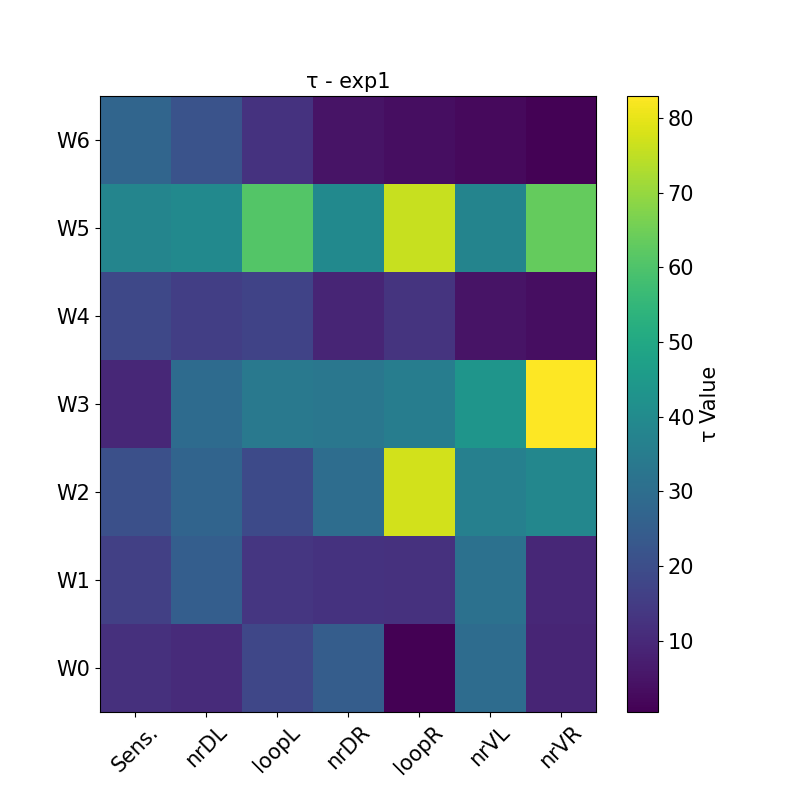

/Users/mahsa/Documents/phd-thesis-code/Plotting/Functions/Autocorr.py:317: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=(8, 8))


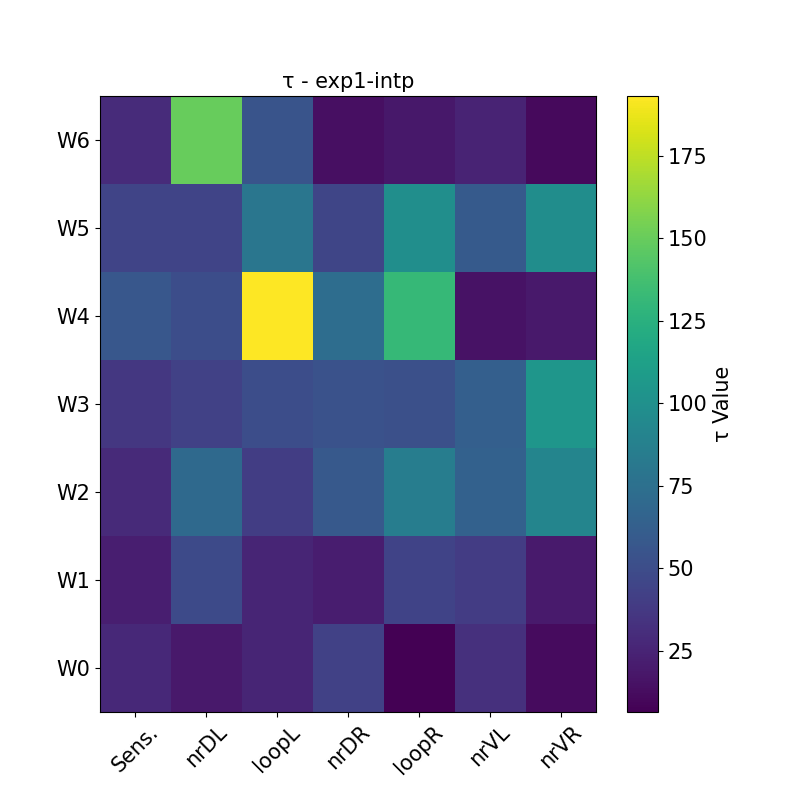

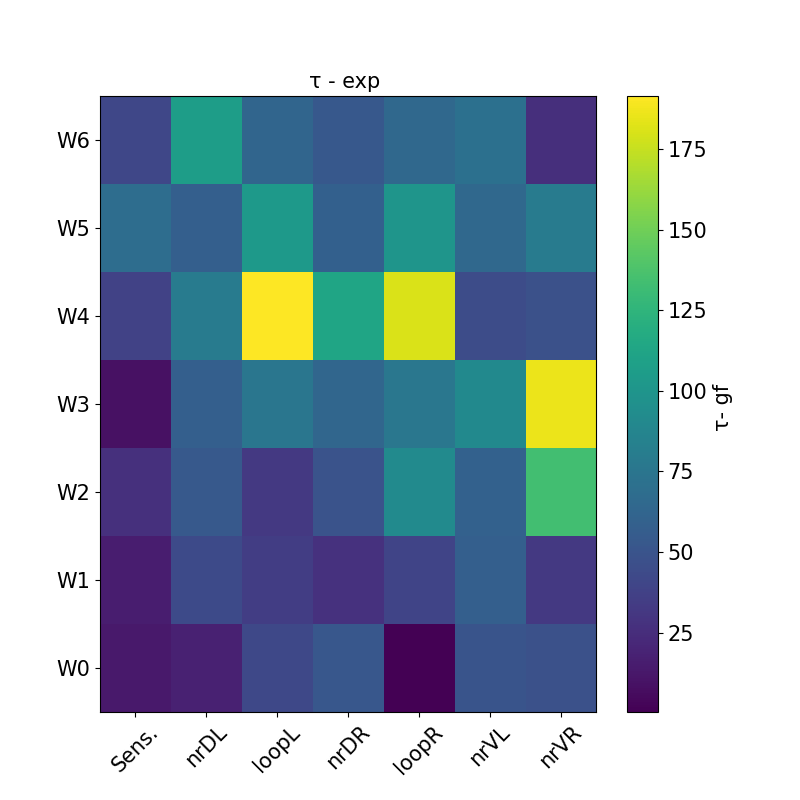

In [33]:
fig1 = Aut.plot_parameters_heat(exp1_ax0,n_tit, WormLabel, paramName='τ Value',fs = 15,titre = 'τ - exp1')
fig2 = Aut.plot_parameters_heat(exp1_ax,n_tit, WormLabel, paramName='τ Value',fs = 15,titre = 'τ - exp1-intp')
fig3 = Aut.plot_parameters_heat(Time_constant_ax0[:,:,0],n_tit, WormLabel, paramName='τ- gf ',fs = 15,titre = 'τ - exp ')


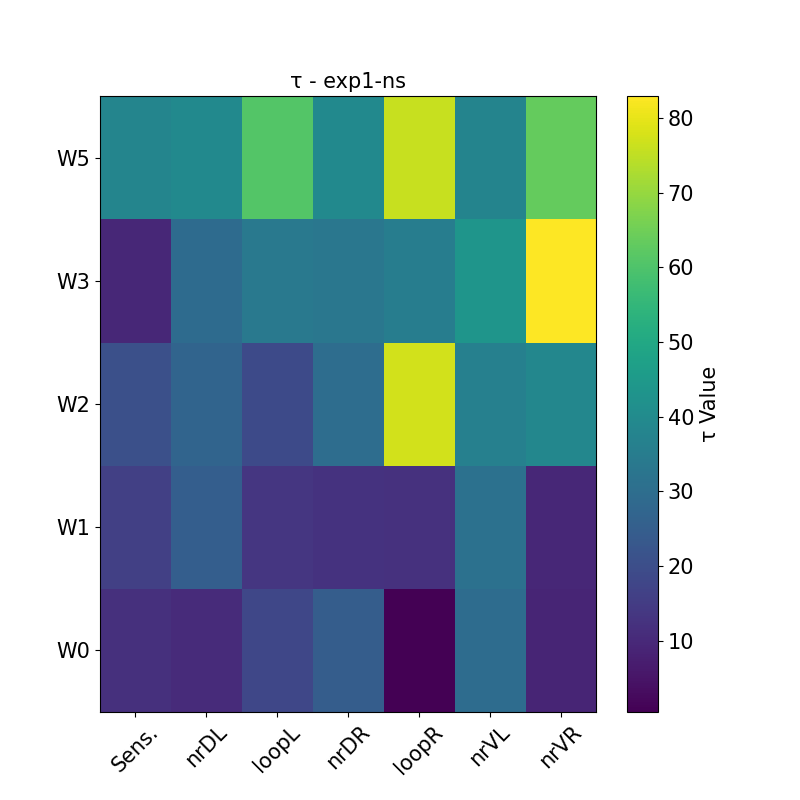

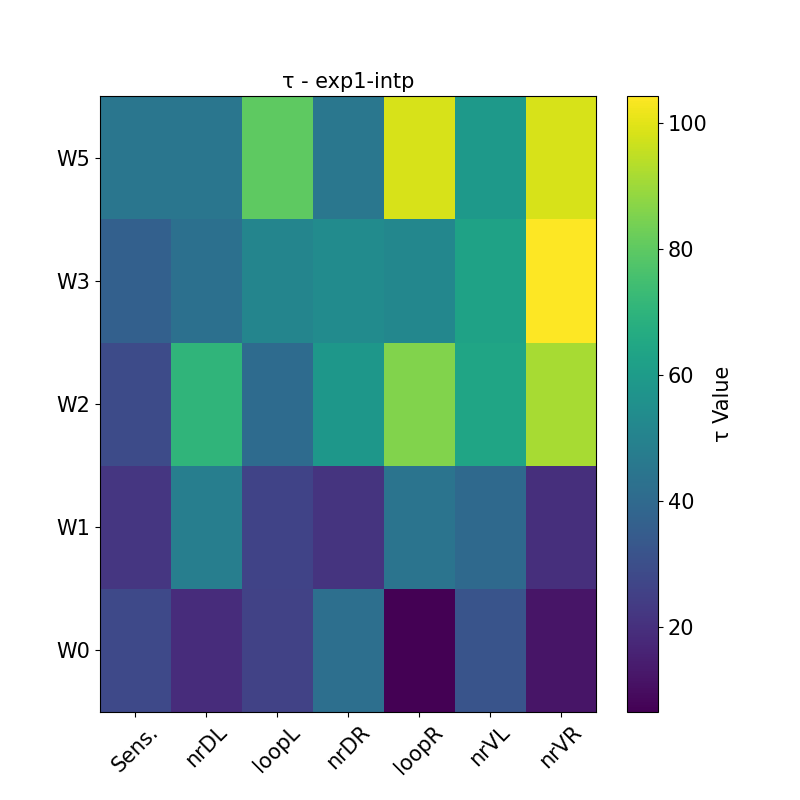

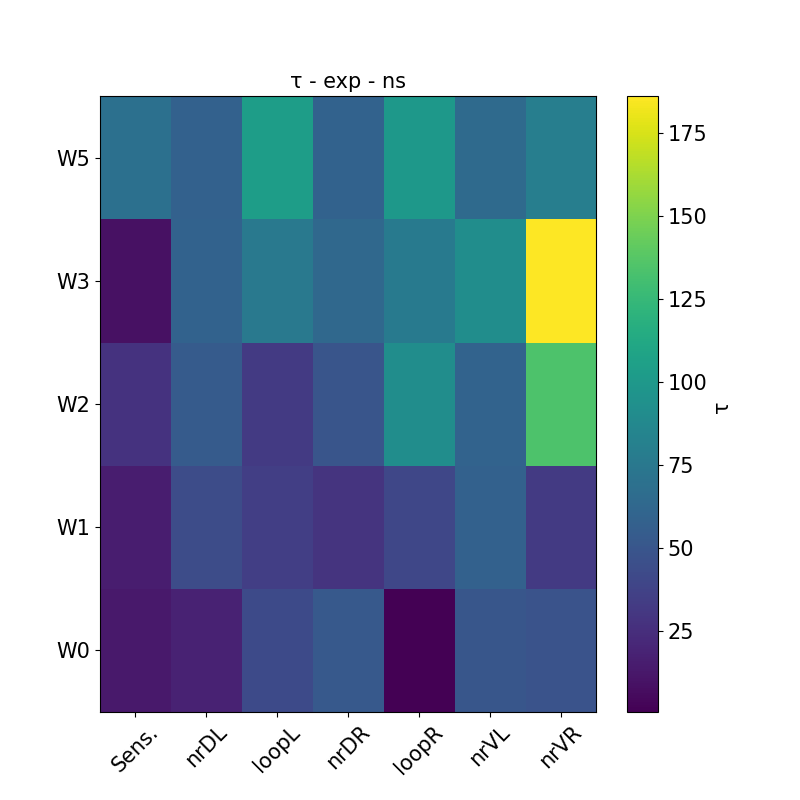

In [34]:
worms_to_select = [0,1,2,3,5] 
WormLabel_sub = [WormLabel[i] for i in worms_to_select]
fig = Aut.plot_parameters_heat(exp1_ax0[worms_to_select,:],n_tit, WormLabel_sub, paramName='τ Value',fs = 15,titre = 'τ - exp1-ns')
fig = Aut.plot_parameters_heat(exp1_ax[worms_to_select,:],n_tit, WormLabel_sub, paramName='τ Value',fs = 15,titre = 'τ - exp1-intp')
fig = Aut.plot_parameters_heat(Time_constant_ax0[worms_to_select,:,0],n_tit, WormLabel_sub, paramName='τ ',fs = 15,titre = 'τ - exp - ns')


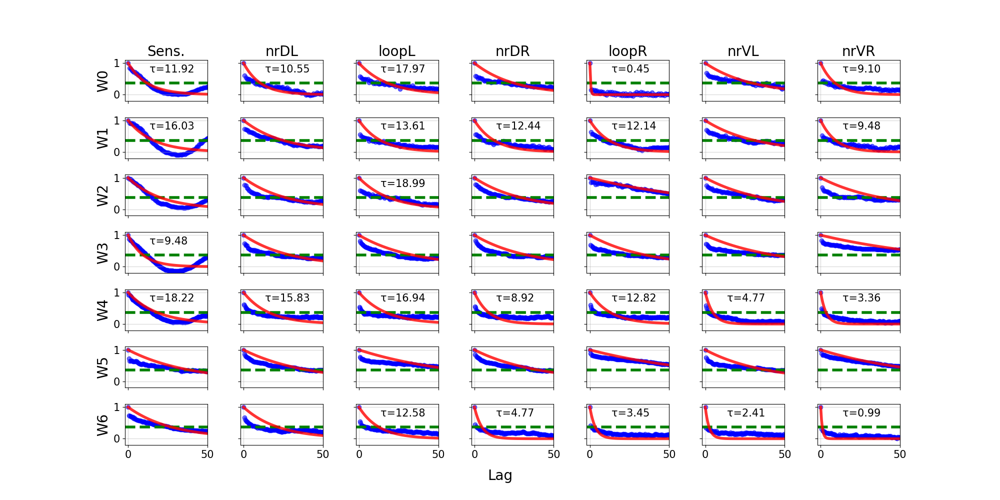

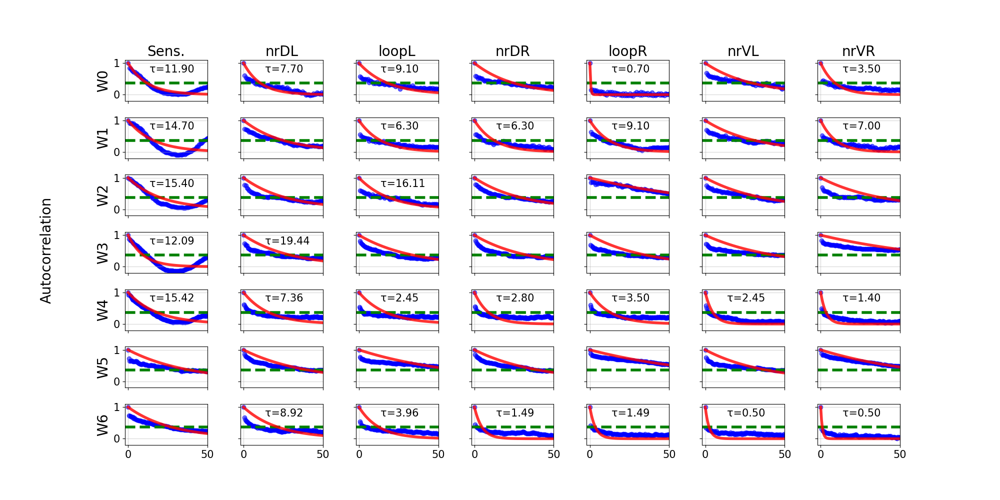

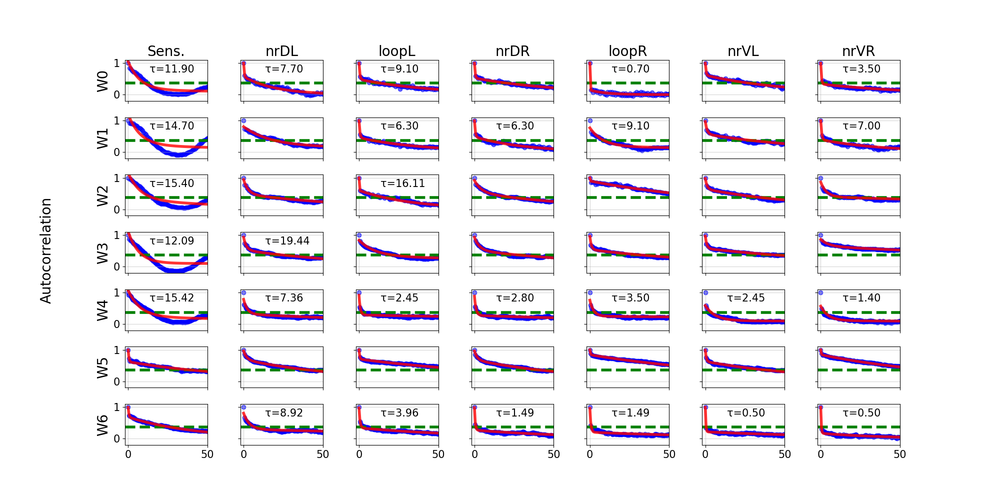

In [35]:
fig = Aut.plot_AllneuronsFit(FullLags_ax0,FullAutocorr_ax0,n_tit,exp1_ax0,L,exp=1,limit=50)
fig.savefig(f"{outDir}all_neuritesFit_exp1.pdf", dpi=res, bbox_inches='tight')
fig.savefig(f"{outDir}all_neuritesFit_exp1.png", dpi=res, bbox_inches='tight')
fig = Aut.plot_AllneuronsFit_thresh(FullLags_ax0,FullAutocorr_ax0,n_tit,exp1_ax0,threshTimes_ax0,L,exp=1,limit=50)
fig.savefig(f"{outDir}all_neuritesFit_exp1_thresh.pdf", dpi=res, bbox_inches='tight')
fig.savefig(f"{outDir}all_neuritesFit_exp1_thresh.png", dpi=res, bbox_inches='tight')
fig = Aut.plot_AllneuronsFit_thresh(FullLags_ax0,FullAutocorr_ax0,n_tit,de_ax0,threshTimes_ax0,L,exp=2,limit=50)
fig.savefig(f"{outDir}all_neuritesFit_exp1_thresh.pdf", dpi=res, bbox_inches='tight')
fig.savefig(f"{outDir}all_neuritesFit_exp1_thresh.png", dpi=res, bbox_inches='tight')

# Time scales of Behavior

In [143]:
beha = [15,16,38,46,26]
beh_lab = ['speed','velocity','HA','CA','HC']

In [154]:
lim=100
FullLags_b0,FullAutocorr_b0,Time_constant_b0,exp1_b0,gaussian_bf,threshTimes_b0,de_b0 = Aut.get_time_scale(MegaData0[1:7,:,beha],L[1:],           
                                                                                MegaData0[1:7,:,12],neurite=True)
FullLags_bf,FullAutocorr_bf,Time_constant_bf,exp1_bf,gaussian_bf,threshTimes_bf,de_bf = Aut.get_time_scale(MegaData_filled[1:7,:,beha],L[1:],
                                                                                MegaData0[1:7,:,12],neurite=True)
FullLagsb_inter,FullAutocorrb_inter,Time_constantb_inter,exp1b_inter,gaussianb_inter,stretched_exponentialb_inter,power_lawb_inter,threshTimesb_inter,de_binter = Aut.get_time_scale(MegaData_interp[1:7,:,beha],
                                                                                    L[1:],MegaData0[1:7,:,12],allfit=True,thresh=lim,neurite=True)
FullLagsb_lim,FullAutocorrb_lim,Time_constantb_lim,exp1b_lim,gaussianb_lim,stretched_exponentialb_lim,power_lawb_lim,threshTimesb_lim,de_b = Aut.get_time_scale(MegaData0[1:7,:,beha],
                                                                                                    L[1:],MegaData0[1:7,:,12],allfit=True,thresh=lim,neurite=True)

/Users/mahsa/Documents/phd-thesis-code/Plotting/Functions/Autocorr.py:84: RuntimeWarning: overflow encountered in exp
  return np.exp(-tau / tau_0)
/Users/mahsa/Documents/phd-thesis-code/Plotting/Functions/Autocorr.py:81: RuntimeWarning: overflow encountered in exp
  return A * np.exp(-tau / tau_0)
/Users/mahsa/Documents/phd-thesis-code/Plotting/Functions/Autocorr.py:99: RuntimeWarning: overflow encountered in exp
  return A1 * np.exp(-tau / tau1) + A2 * np.exp(-tau / tau2)
/Users/mahsa/miniconda3/envs/Targettrack/lib/python3.8/site-packages/scipy/optimize/_minpack_py.py:906: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
/Users/mahsa/Documents/phd-thesis-code/Plotting/Functions/Autocorr.py:102: RuntimeWarning: invalid value encountered in power
  return A * np.exp(-((tau / tau0) ** beta))
/Users/mahsa/Documents/phd-thesis-code/Plotting/Functions/Autocorr.py:102: RuntimeWarning: divide by zero 

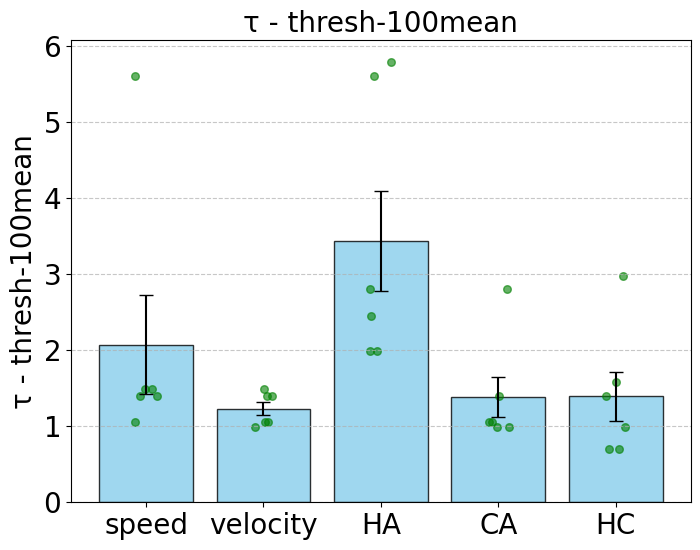

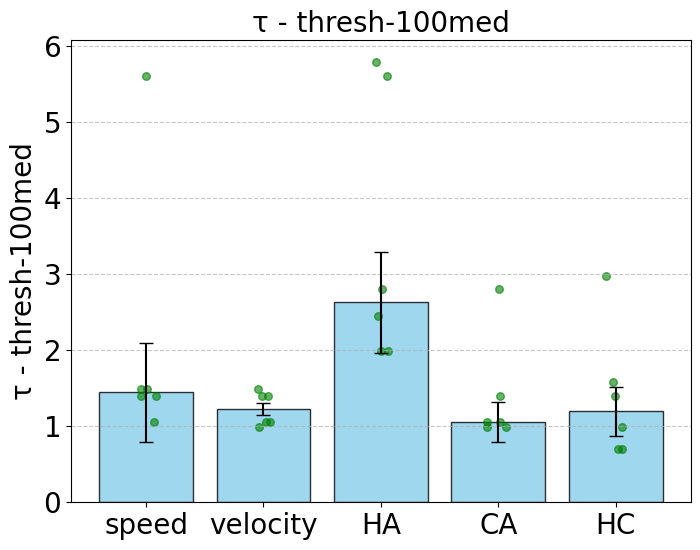

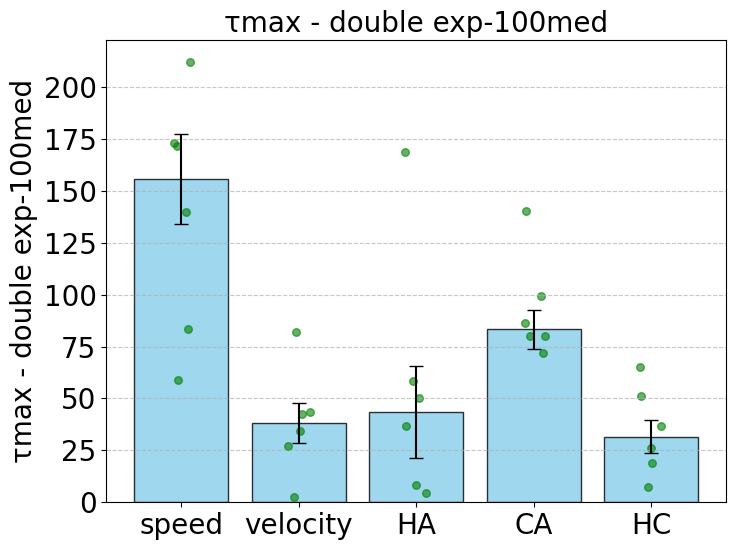

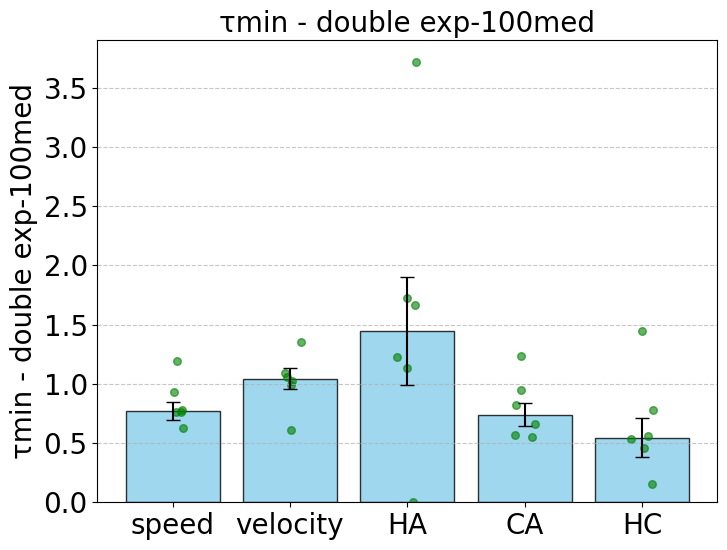

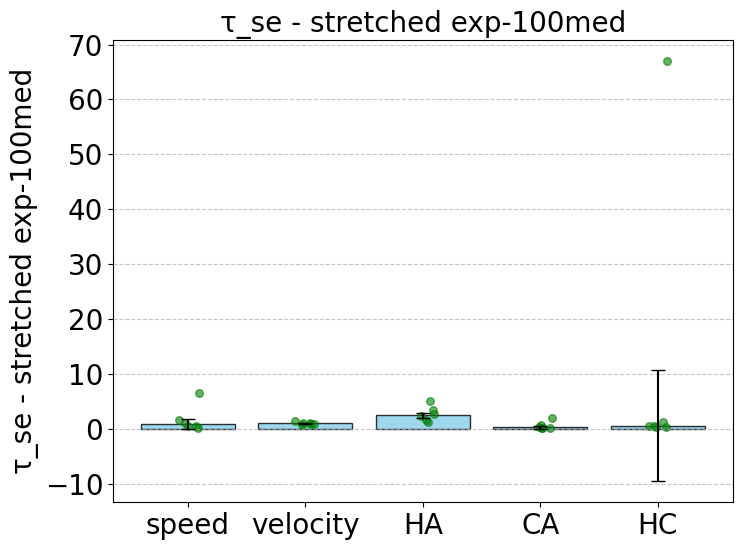

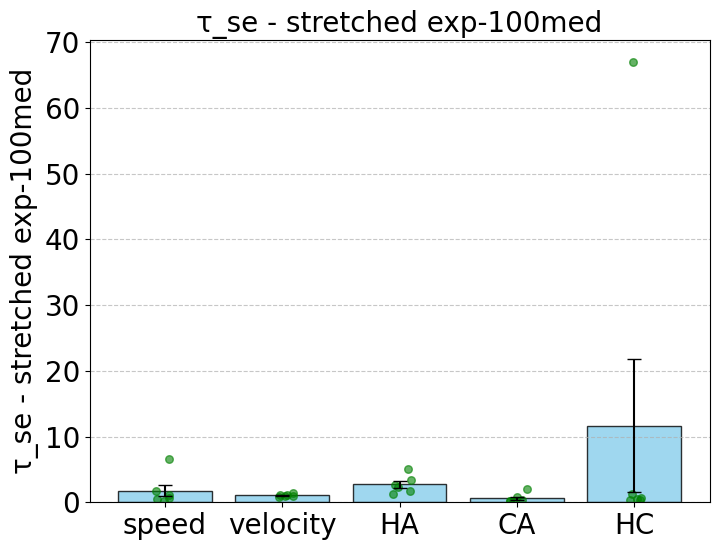

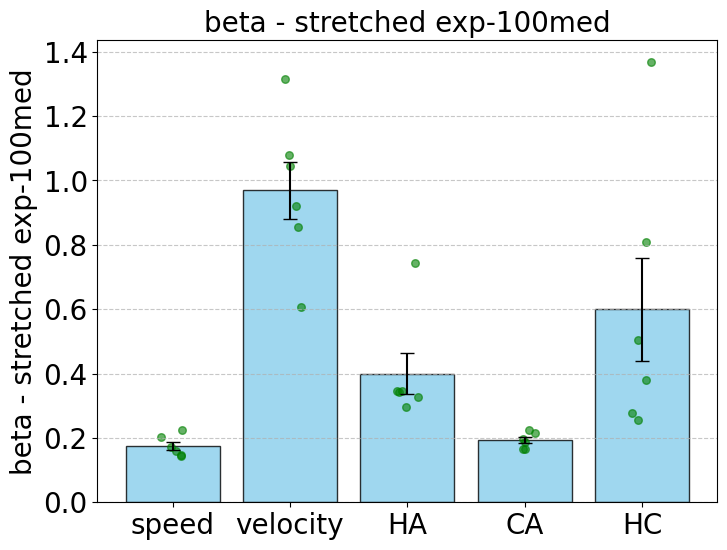

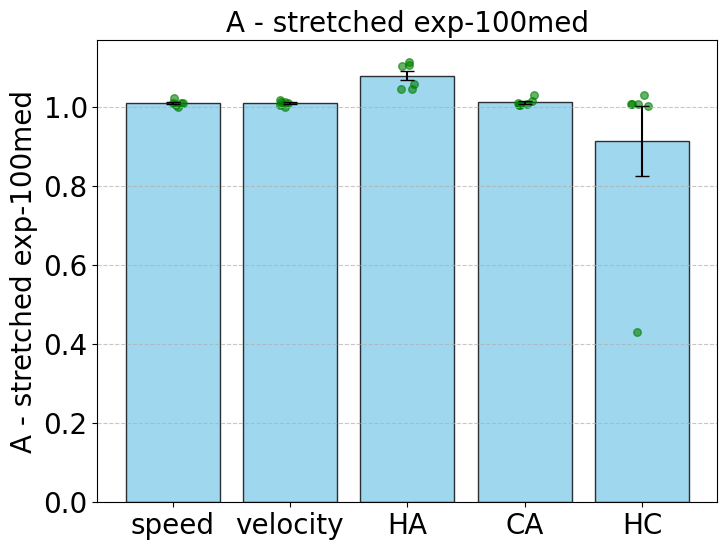

In [193]:
fig1 = Aut.plot_parameters_bar(threshTimesb_lim,beh_lab, paramName=f'τ - thresh-{lim}mean',fs = 20,dots=dot)
fig2 = Aut.plot_parameters_bar(threshTimesb_lim,beh_lab, paramName=f'τ - thresh-{lim}med',fs = 20,median=1,dots=dot)
fig3 = Aut.plot_parameters_bar(np.max(de_b[:,:,:2],axis=2),beh_lab,
                               paramName=f'τmax - double exp-{lim}med',fs = 20,median=1,dots=dot)
fig4 = Aut.plot_parameters_bar(np.min(de_b[:,:,:2],axis=2),beh_lab,
                               paramName=f'τmin - double exp-{lim}med',fs = 20,median=1,dots=dot)

##stretched exp
fig5 = Aut.plot_parameters_bar(stretched_exponentialb_lim[:,:,0],beh_lab,
                               paramName=f'τ_se - stretched exp-{lim}med',fs = 20,median=1,dots=dot)
fig6 = Aut.plot_parameters_bar(stretched_exponentialb_lim[:,:,0],beh_lab,
                               paramName=f'τ_se - stretched exp-{lim}med',fs = 20,dots=dot)
fig7 = Aut.plot_parameters_bar(stretched_exponentialb_lim[:,:,1],beh_lab,
                               paramName=f'beta - stretched exp-{lim}med',fs = 20,median=0,dots=dot)
fig8 = Aut.plot_parameters_bar(stretched_exponentialb_lim[:,:,2],beh_lab,
                               paramName=f'A - stretched exp-{lim}med',fs = 20,median=0,dots=dot)
for form in ['.png','.pdf']:
    fig1.savefig(f"{outDir}Behavior_thresh_bar_mean{lim}dot{dot}{form}", dpi=res, bbox_inches='tight')
    fig2.savefig(f"{outDir}Behavior_thresh_bar_med{lim}dot{dot}{form}", dpi=res, bbox_inches='tight')
    fig3.savefig(f"{outDir}Behavior_taumax_doubleExp_bar_med{lim}dot{dot}{form}", dpi=res, bbox_inches='tight')
    fig4.savefig(f"{outDir}Behavior_taumin_doubleExp_bar_med{lim}dot{dot}{form}", dpi=res, bbox_inches='tight')
    fig5.savefig(f"{outDir}Behavior_tau_strExp_bar_med{lim}dot{dot}{form}", dpi=res, bbox_inches='tight')
    fig6.savefig(f"{outDir}Behavior_tau_strExp_bar_mean{lim}dot{dot}{form}", dpi=res, bbox_inches='tight')
    fig7.savefig(f"{outDir}Behavior_beta_strExp_bar_mean{lim}dot{dot}{form}", dpi=res, bbox_inches='tight')
    fig8.savefig(f"{outDir}Behavior_A_strExp_bar_mean{lim}dot{dot}{form}", dpi=res, bbox_inches='tight')

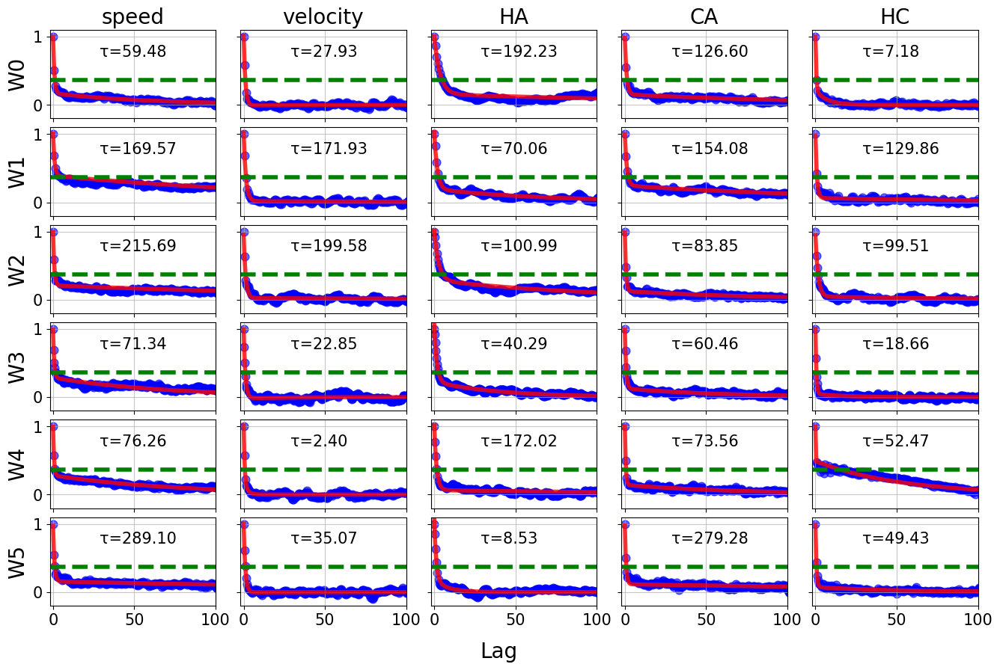

In [181]:
figde,axesde = Aut.plot_AllneuronsFit_thresh(FullLags_b0,FullAutocorr_b0,beh_lab,de_b0,threshTimesb_lim,L[1:],exp=2,limit=lim,writeT=1)
for form in ['.png','.pdf']:
    figde.savefig(f"{outDir}Behave_doubleExpFit{lim}{form}", dpi=res, bbox_inches='tight')

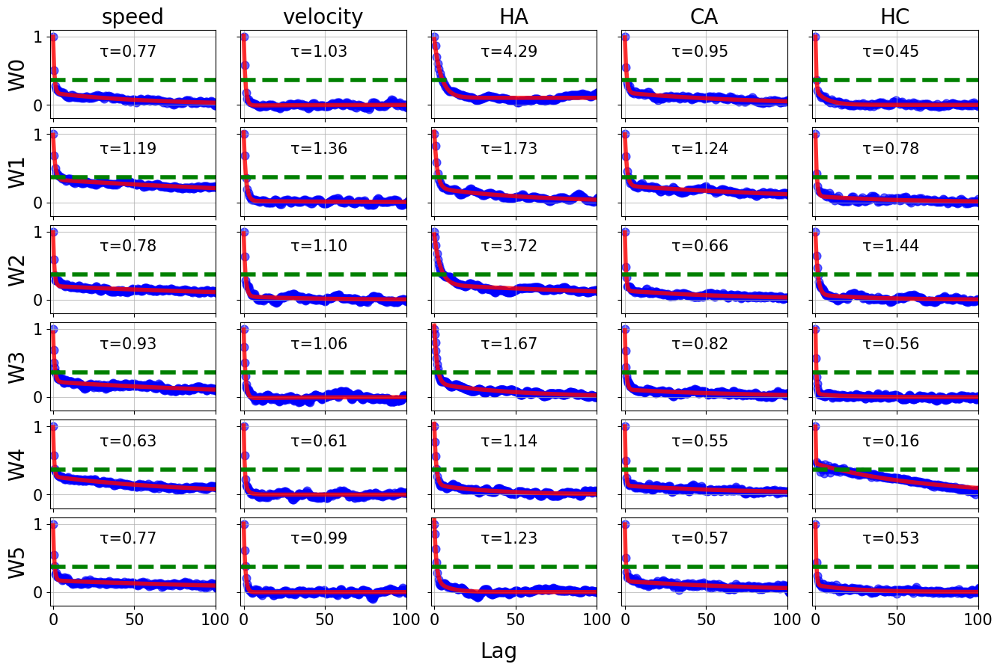

In [185]:
figde,axesde = Aut.plot_AllneuronsFit_thresh(FullLagsb_lim,FullAutocorrb_lim,beh_lab,de_b,de_b[:,:,1],L[1:],exp=2,limit=lim,writeT=0)

figde.savefig(f"{outDir}Behave__doubleExpFit{lim}_minT.png", dpi=res, bbox_inches='tight')

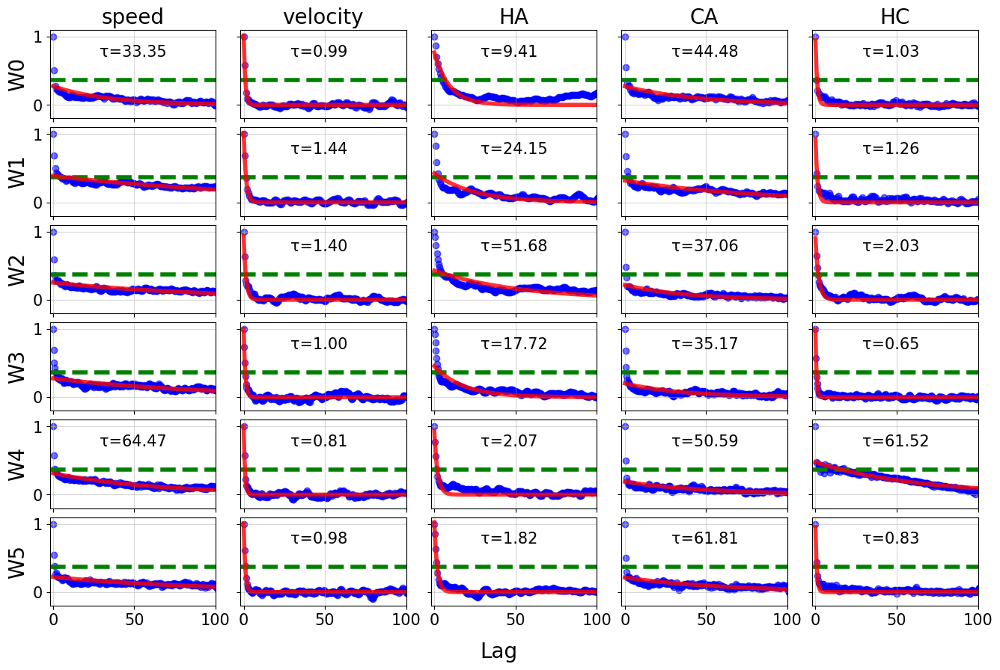

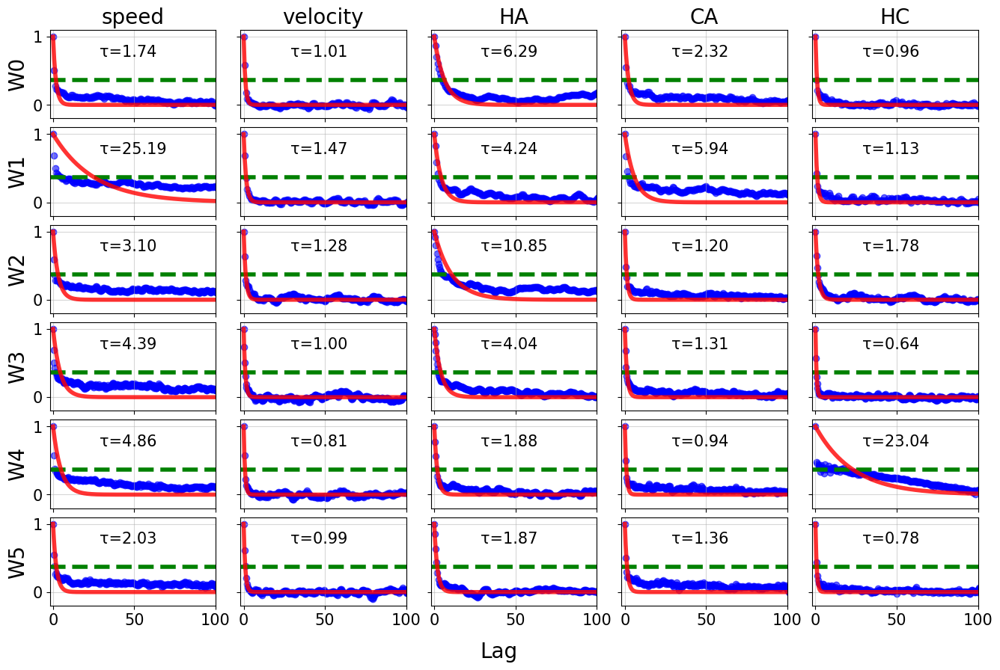

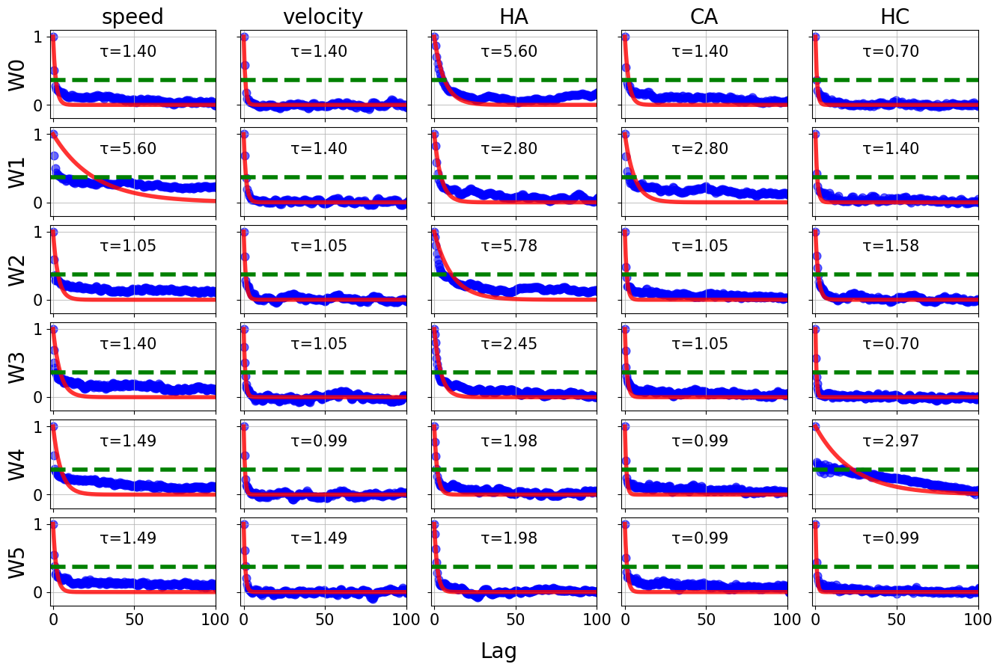

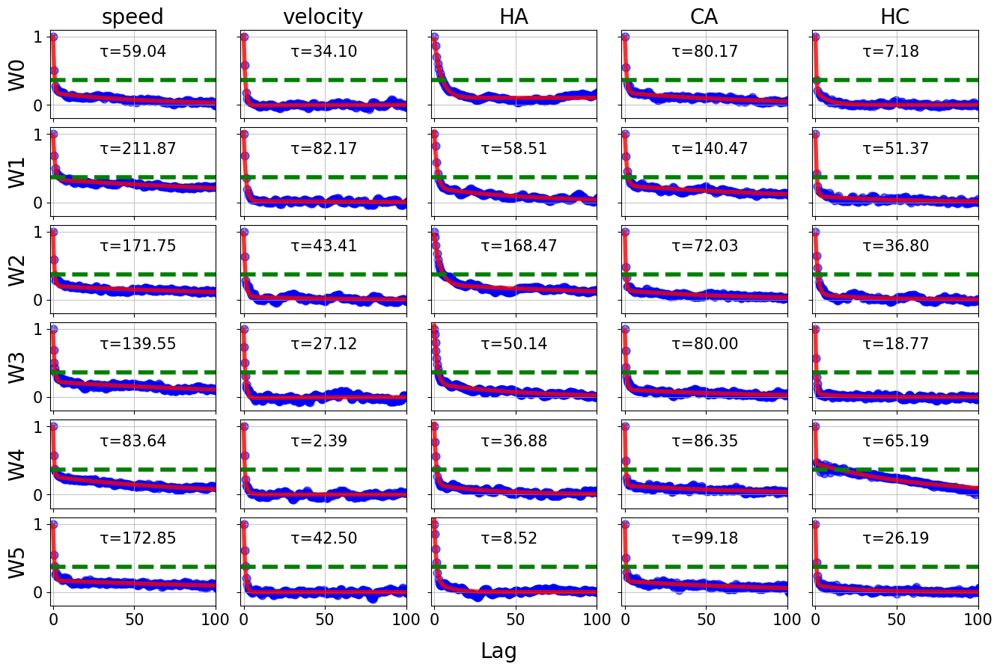

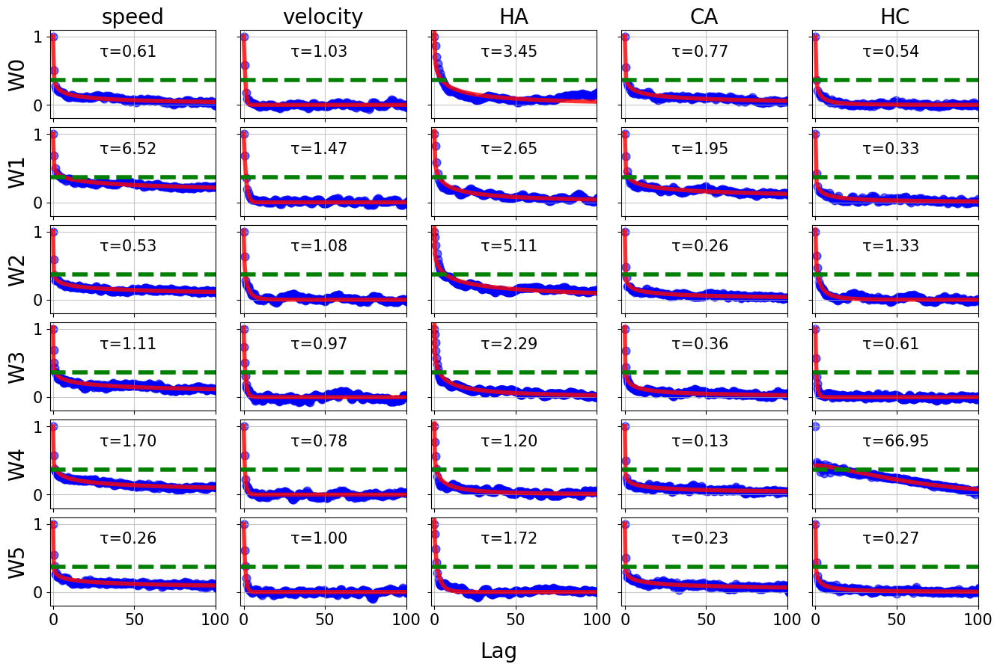

In [183]:
fig1 = Aut.plot_AllneuronsFit(FullLagsb_lim,FullAutocorrb_lim,beh_lab,Time_constantb_lim,L[1:],exp=0,limit=lim)
fig2 = Aut.plot_AllneuronsFit(FullLagsb_lim,FullAutocorrb_lim,beh_lab,exp1b_lim,L[1:],exp=1,limit=lim)
fig3,x = Aut.plot_AllneuronsFit_thresh(FullLagsb_lim,FullAutocorrb_lim,beh_lab,exp1b_lim,threshTimesb_lim,L[1:],exp=1,limit=lim)
figde,axesde = Aut.plot_AllneuronsFit_thresh(FullLagsb_lim,FullAutocorrb_lim,beh_lab,de_b,threshTimesb_lim,L[1:],exp=2,limit=lim,writeT=1)
figse,axesse = Aut.plot_AllneuronsFit_thresh(FullLagsb_lim,FullAutocorrb_lim,beh_lab,
                                              stretched_exponentialb_lim,threshTimesb_lim,L[1:],exp=3,limit=lim,writeT=1)
for form in ['.png','.pdf']:
    fig1.savefig(f"{outDir}Behave_Fit_exp{lim}{form}", dpi=res, bbox_inches='tight')
    fig2.savefig(f"{outDir}Behave_Fit_exp1{lim}{form}", dpi=res, bbox_inches='tight')
    fig3.savefig(f"{outDir}Behave_Fit_ex1shown_threshwritten{lim}{form}", dpi=res, bbox_inches='tight')
    figde.savefig(f"{outDir}Behave__doubleExpFit{lim}{form}", dpi=res, bbox_inches='tight')
    figse.savefig(f"{outDir}Behave__streExpFit{lim}{form}", dpi=res, bbox_inches='tight')

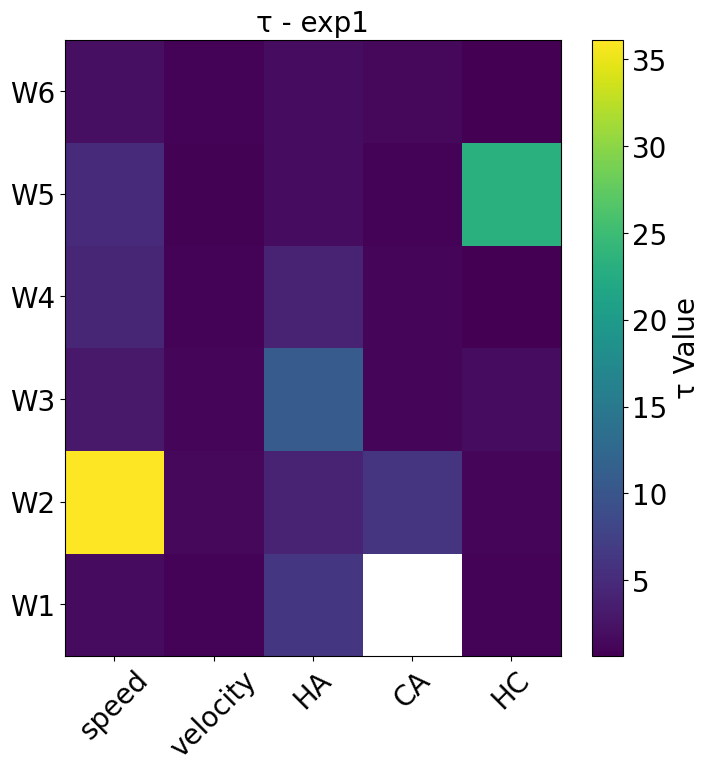

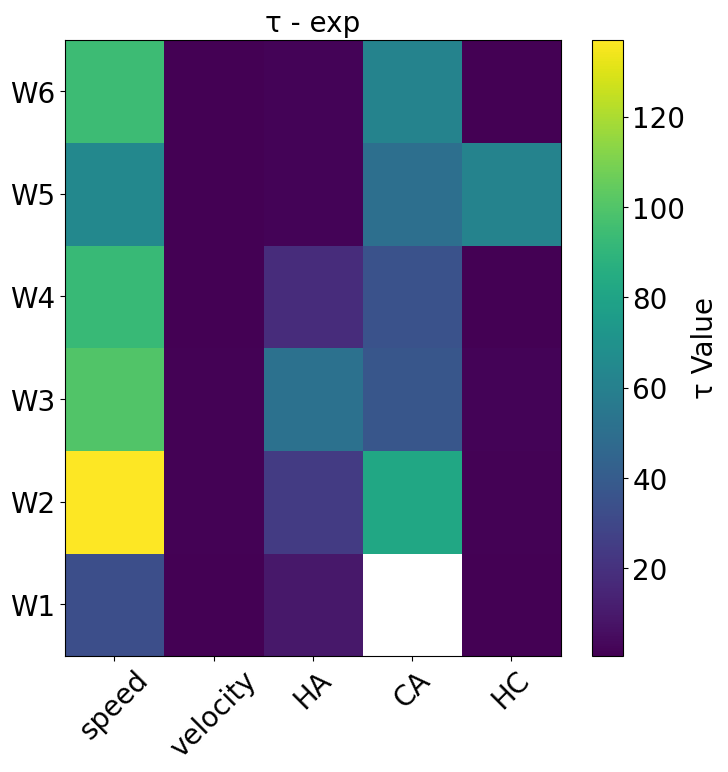

In [153]:

WormLabel = ['W0','W1','W2','W3','W4','W5','W6']
fig = Aut.plot_parameters_heat(exp1_b0,beh_lab, WormLabel[1:], paramName='τ Value',fs = 20,titre = 'τ - exp1')
fig = Aut.plot_parameters_heat(Time_constantb_lim[:,:,0],beh_lab, WormLabel[1:], paramName='τ Value',fs = 20,titre = 'τ - exp')

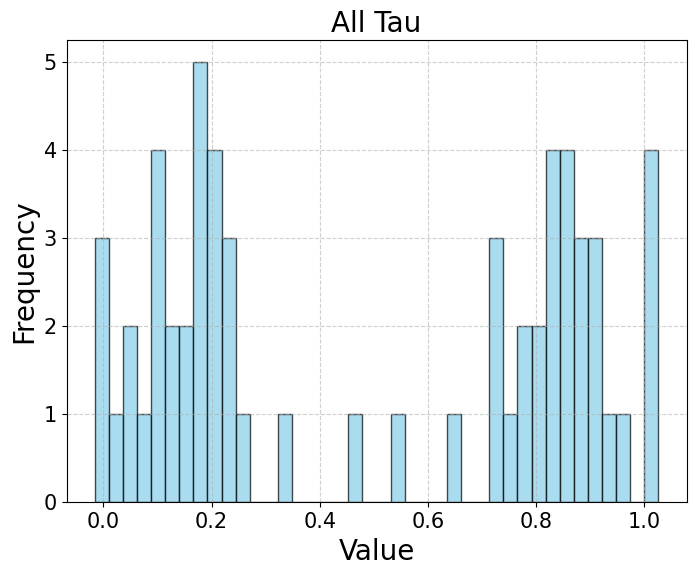

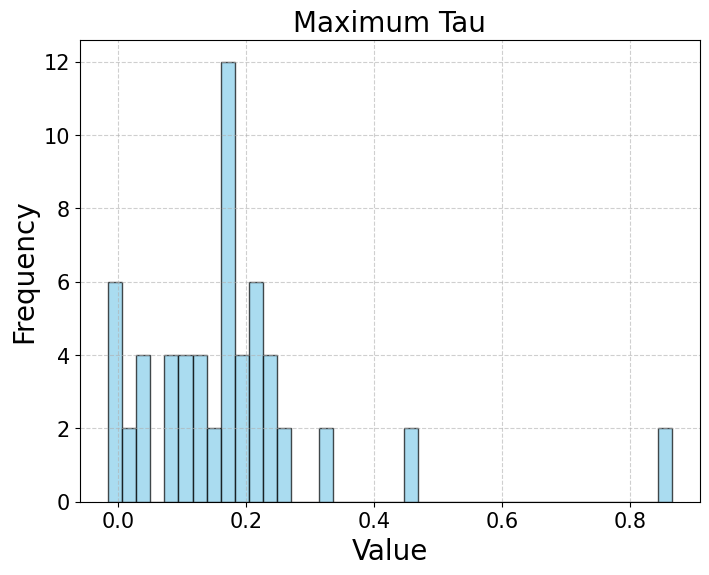

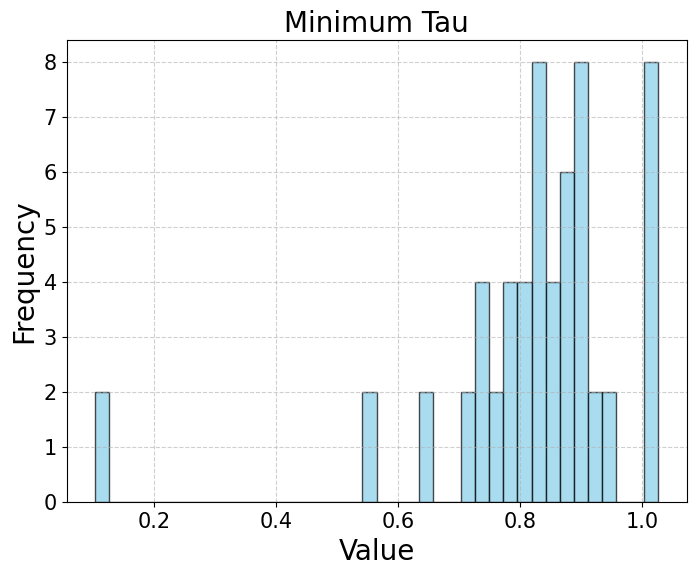

In [202]:
data = de_b[:,:,2:4]
#data[data>1000]=0
fighistAll = AllF.plot_hist_all(data,b=40,titre='All Tau')
datamax0 = de_b[:,:,2:4]
datamax = copy.deepcopy(datamax0)
datamax_arg = np.argmax(de_b[:,:,:2],axis=2)
for i in range(datamax0.shape[0]):
    for j in range(datamax0.shape[1]):
        datamax[i,j] = datamax0[i,j,datamax_arg[i,j]]
#datamax[datamax>1000]=0
fighistMax = AllF.plot_hist_all(datamax,b=40,titre='Maximum Tau')
datamin_arg = np.argmin(de_b[:,:,:2],axis=2)
datamin = copy.deepcopy(datamax0)
for i in range(datamax0.shape[0]):
    for j in range(datamax0.shape[1]):
        datamin[i,j] = datamax0[i,j,datamin_arg[i,j]]
#datamin = np.min(de_b[:,:,:2],axis=2)
#datamin[datamin>3]=0
fighistMin = AllF.plot_hist_all(datamin,b=40,titre='Minimum Tau')
for form in ['.png','.pdf']:
    fighistMax.savefig(f"{outDir}Behavior_Hist_Exp2_AMax_barInterNuc_{lim}{refine}{form}", dpi=res, bbox_inches='tight')
    fighistMin.savefig(f"{outDir}Behavior_Hist_Exp2_AMin_barInterNuc_{lim}{refine}{form}", dpi=res, bbox_inches='tight')
    fighistAll.savefig(f"{outDir}Behavior_Hist_Exp2_AAll_barInterNuc_{lim}{refine}{form}", dpi=res, bbox_inches='tight')

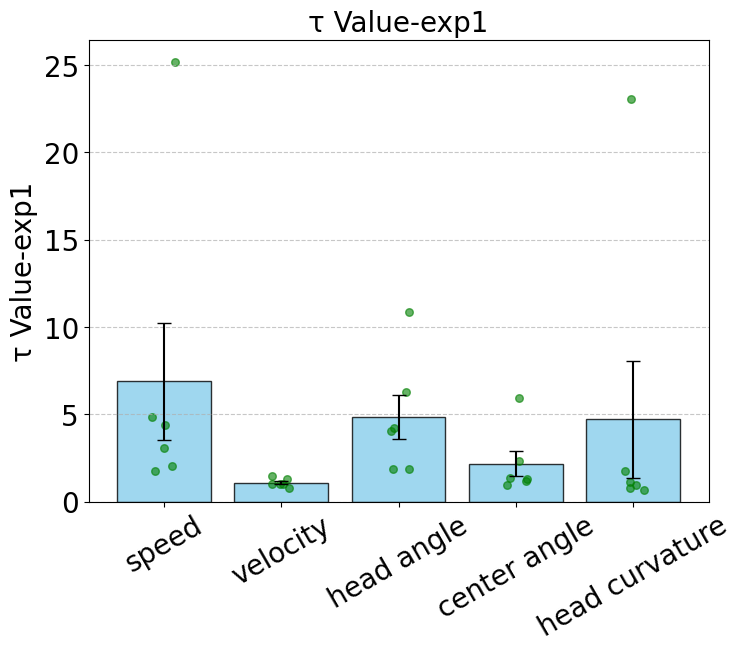

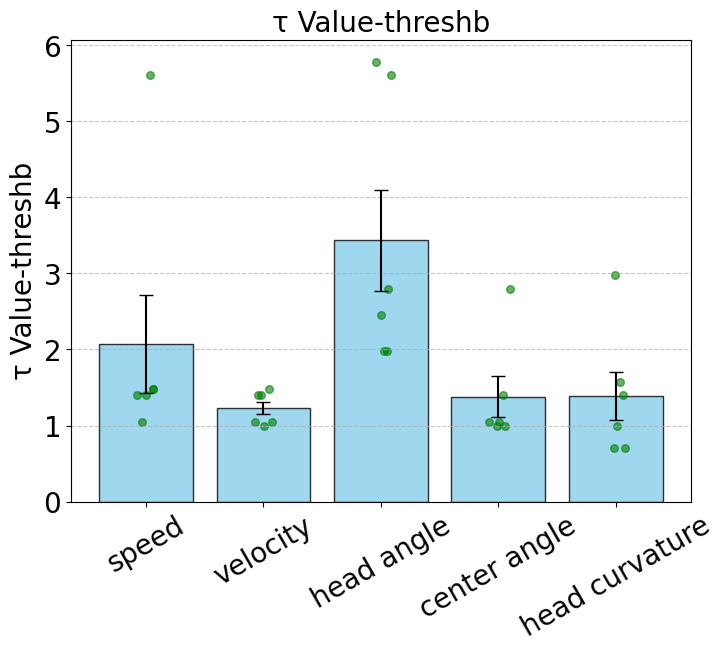

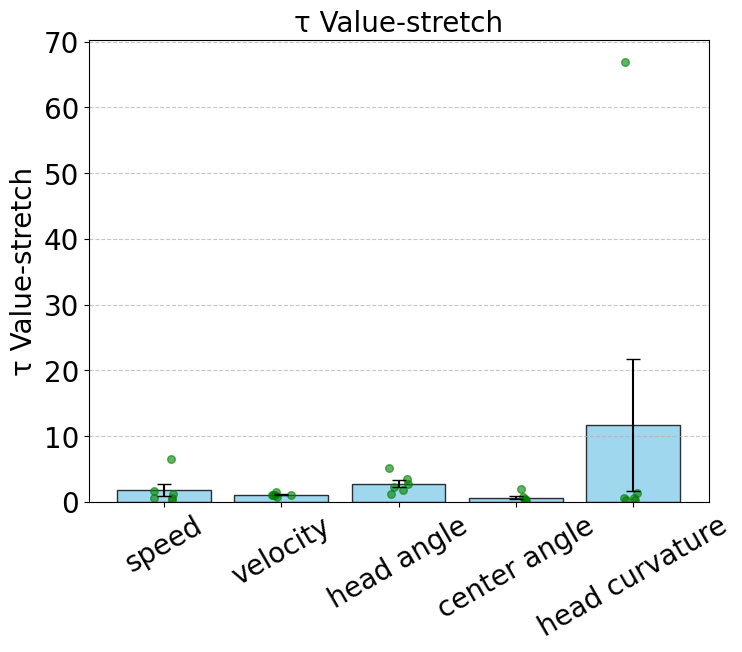

In [192]:
fig1 = Aut.plot_parameters_bar(exp1b_lim,['speed','velocity','head angle','center angle','head curvature'], 
                              paramName='τ Value-exp1',fs = 20,r=30,dots=dot)
fig2 = Aut.plot_parameters_bar(threshTimesb_lim,['speed','velocity','head angle','center angle','head curvature'], 
                              paramName='τ Value-threshb',fs = 20,r=30,dots=dot)
fig3 = Aut.plot_parameters_bar(stretched_exponentialb_lim[:,:,0],['speed','velocity','head angle','center angle','head curvature'], 
                              paramName='τ Value-stretch',fs = 20,r=30,dots=dot)
for form in ['.png','.pdf']:
    fig1.savefig(f"{outDir}tau_behaviors_exp1lim{form}", dpi=res, bbox_inches='tight')
    fig2.savefig(f"{outDir}tau_behaviors_threshlim{form}", dpi=res, bbox_inches='tight')
    fig3.savefig(f"{outDir}tau_behaviors_stretchExplim{form}", dpi=res, bbox_inches='tight')

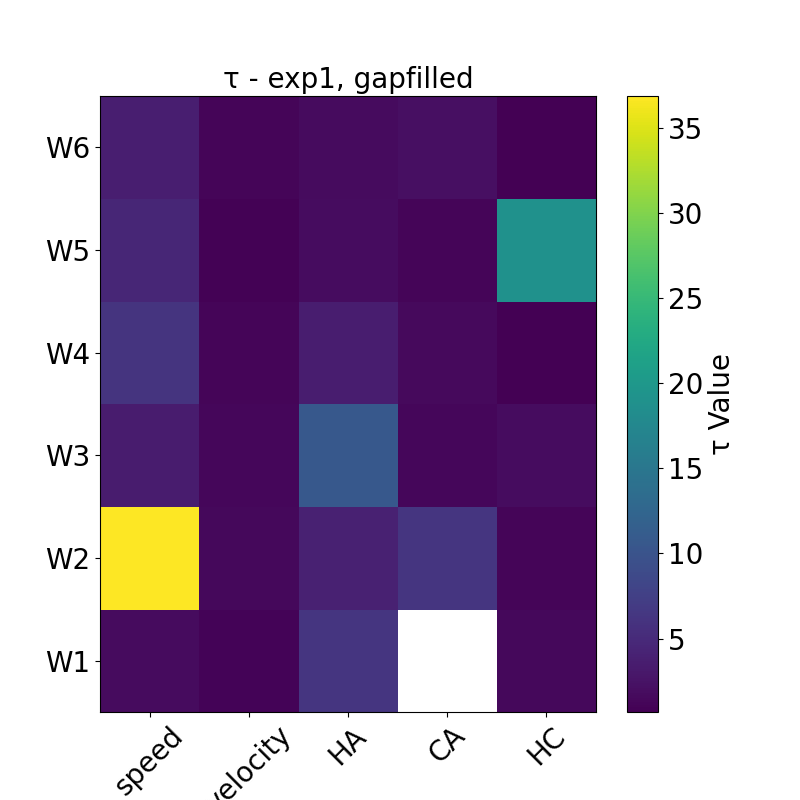

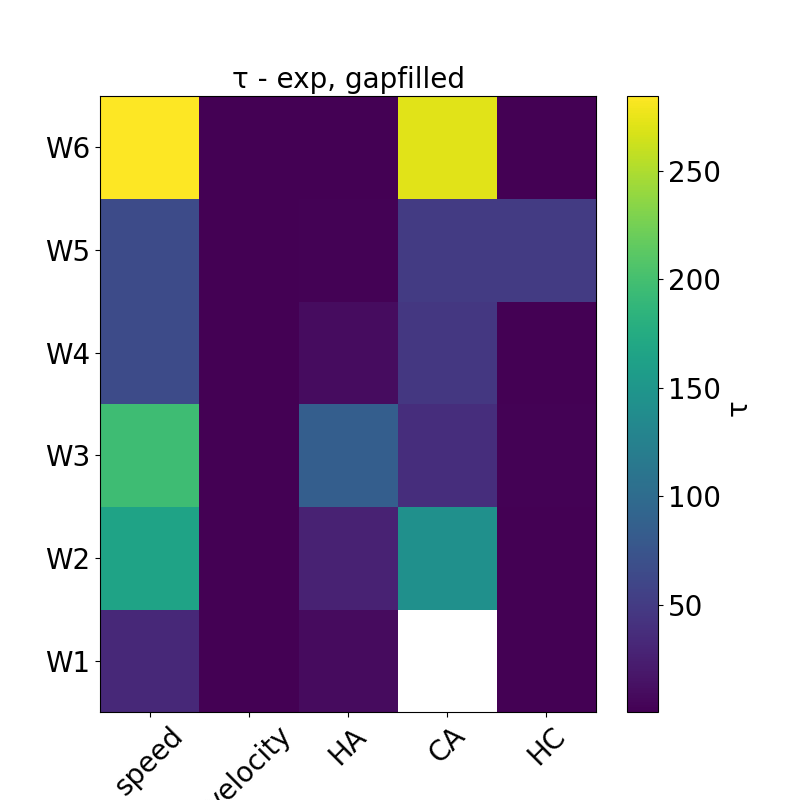

In [40]:

fig =Aut.plot_parameters_heat(exp1_bf,beh_lab, WormLabel[1:], paramName='τ Value',fs = 20,titre = 'τ - exp1, gapfilled')
fig = Aut.plot_parameters_heat(Time_constant_bf[:,:,0],beh_lab, WormLabel[1:], paramName='τ ',fs = 20,titre = 'τ - exp, gapfilled')

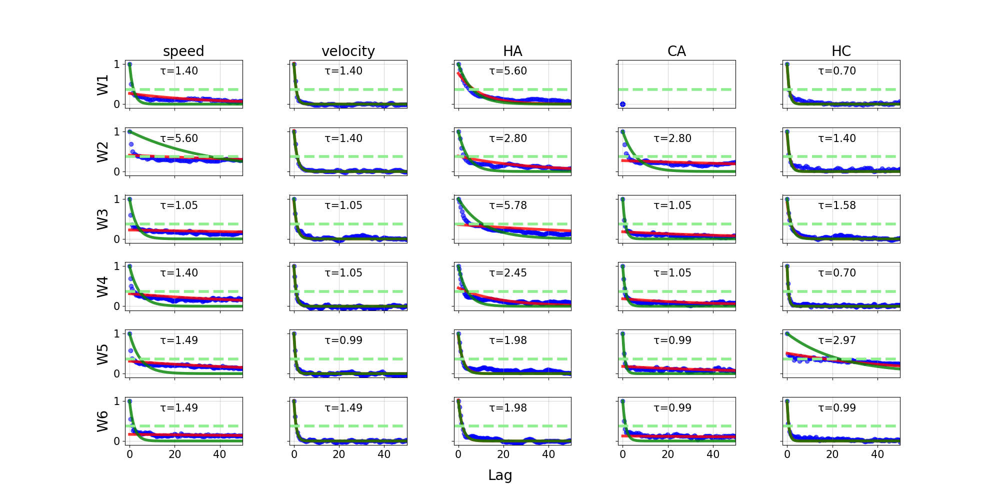

In [41]:
# Adjust figure size and create 7x7 subplots
fig, axes = plt.subplots(6, 5, figsize=(20, 10), sharex=True, sharey=True)
fig.subplots_adjust(hspace=0.4, wspace=0.4)
Neur_lab = ["RIAL","RIAR","RIML","RIMR","RIBL","RIBR",'Sensory']
# Loop over all combinations of n and d
for n in range(5):
    for d in range(6):
        ax = axes[d, n]  # Access the subplot
        d_real = d+1
        # Extract data for current n and d
        temp = FullLags_b0[d, L[d_real]-1:2*L[d_real]-1, n]
        autocorr = FullAutocorr_b0[d, L[d_real]-1:2*L[d_real]-1, n]
        popt = Time_constant_b0[d, n, 1], Time_constant_b0[d, n, 0]#exp1_ax0[d,n],
        popt1 = exp1_b0[d,n],
        # Plot scatter and fitted curve
        ax.scatter(temp, autocorr, label="Data", color="blue", alpha=0.6)
        ax.plot(temp, Aut.exponential_decay(temp, *popt), label="Fit", color="red", alpha=0.8,lw=4)
        ax.plot(temp, Aut.exponential1_decay(temp, *popt1), label="Fit", color="green", alpha=0.8,lw=4)
        hl=1/np.e
        ax.axhline(y= hl, color='lightgreen', linestyle='--',lw =4)
        # Add titles and grid
        ne= neu[n]
        ax.grid(alpha=0.5)
        ax.set_ylim(-0.1, 1.1)
        ax.set_xlim(-2,50)
        #ax.set_xscale('log') 
        if d==0:
            ax.set_title(beh_lab[n], fontsize=20)
        if n==0:
            label_obj=ax.set_ylabel(f"W{d_real}", fontsize=20,rotation=90)

        tau_value = threshTimes_b0[d, n]#Time_constant_b0[d, n, 0]#exp1_ax0[d, n]
        if ~np.isnan(tau_value):
            ax.text(0.3, 0.7, f"τ={tau_value:.2f}", transform=ax.transAxes, fontsize=15, color="black")
        # Remove ticks for better readability
        ax.tick_params(axis='both', which='major', labelsize=15)

# Set shared labels
fig.text(0.5, 0.04, 'Lag', ha='center', fontsize=20)
#fig.text(0.04, 0.5, 'Autocorrelation', va='center', rotation='vertical', fontsize=20)
fig.savefig(f"{outDir}All_behaviorsFit_exp_logs.pdf", dpi=res, bbox_inches='tight')
fig.savefig(f"{outDir}All_behaviorsFit_exp_logs.png", dpi=res, bbox_inches='tight')
plt.show()

# Time scale of all neurons and neurites

In [12]:
numW=7
num_neu = 13

In [17]:
n_tit = ["RIAL","RIAR","RIML","RIMR","RIBL","RIBR","Sens.","nrDL","loopL","nrDR","loopR","nrVL","nrVR"]
neu = [0,1,2,3,4,5,6,7,8,27,28,39,40]#[41,42,43,45,46,47,48]
beh_lab = [str(i) for i in neu]
worms_to_select = [0,1,2,3,4,5,6] 
WormLabel_sub = [WormLabel[i] for i in worms_to_select]

In [14]:
importlib.reload(Aut)
lim=300
FullLags_All0,FullAutocorr_All0,Time_constant_All0,exp1_All0,gaussian_All0,threshTimes_All0,de_All0 = Aut.get_time_scale(MegaData0[:numW,:,neu],L,
                                                                                                MegaData0[:numW,:,12])
FullLags_All,FullAutocorr_All,Time_constant_All,exp1_All,gaussian_All,threshTimes_All,de_All = Aut.get_time_scale(MegaData_interp[:numW,:,neu],L,
                                                                                           MegaData0[:numW,:,12])
FullLags_Alllim,FullAutocorr_Alllim,Time_constant_Alllim,exp1_Alllim,gaussian_Alllim,stretched_exponential_Alllim,power_law_Alllim, threshTimes_Alllim,de_Alllim = Aut.get_time_scale(MegaData0[:numW,:,neu],L,
                                                                                MegaData0[:numW,:,12],allfit=True,thresh=lim)

/Users/mahsa/Documents/phd-thesis-code/Plotting/Functions/Autocorr.py:99: RuntimeWarning: overflow encountered in exp
  return A1 * np.exp(-tau / tau1) + A2 * np.exp(-tau / tau2)
/Users/mahsa/miniconda3/envs/Targettrack/lib/python3.8/site-packages/scipy/optimize/_minpack_py.py:906: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',
/Users/mahsa/Documents/phd-thesis-code/Plotting/Functions/Autocorr.py:102: RuntimeWarning: divide by zero encountered in power
  return A * np.exp(-((tau / tau0) ** beta))
/Users/mahsa/Documents/phd-thesis-code/Plotting/Functions/Autocorr.py:102: RuntimeWarning: invalid value encountered in power
  return A * np.exp(-((tau / tau0) ** beta))


In [24]:
worms_to_select = [0,1,2,3,4,5,6] 
WormLabel_sub = [WormLabel[i] for i in worms_to_select]
#exclude RIB and RIM of worm 2
exp1_All0[2,2:6]=np.nan
threshTimes_All0[2,2:6]=np.nan
Time_constant_All0[2,2:6]=np.nan

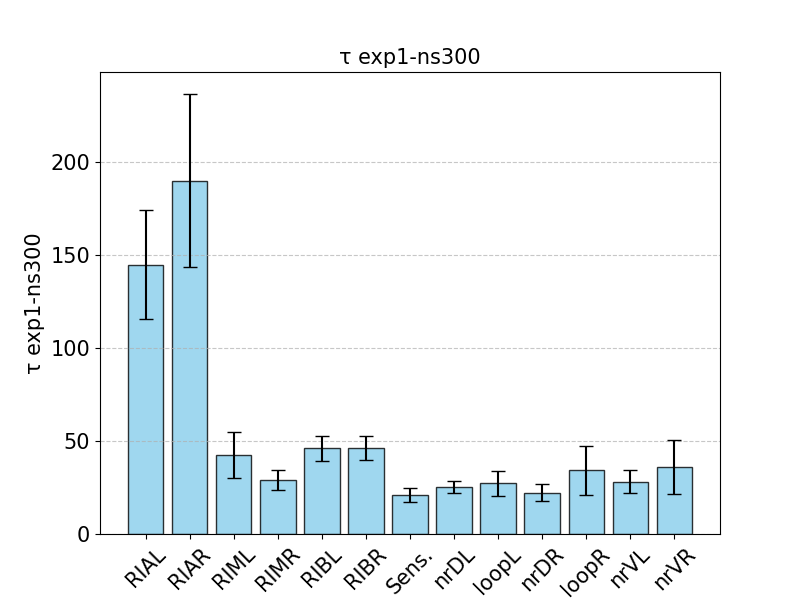

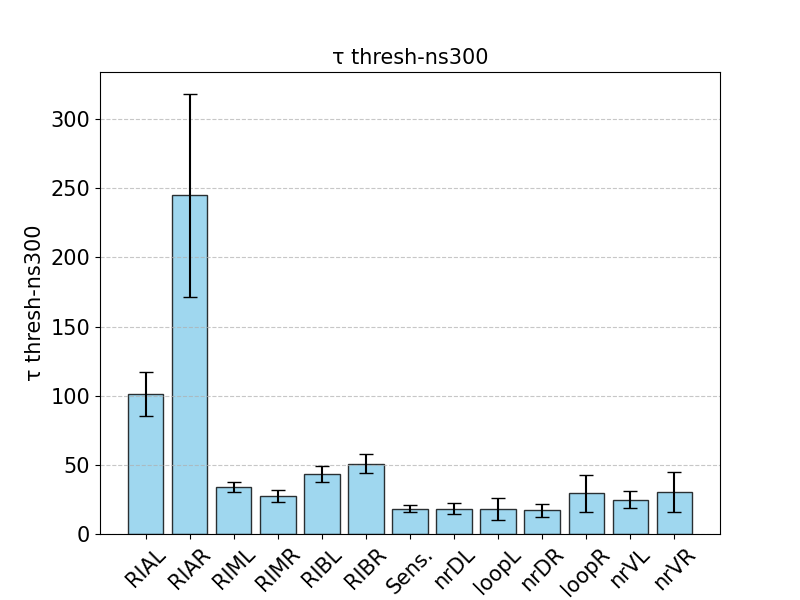

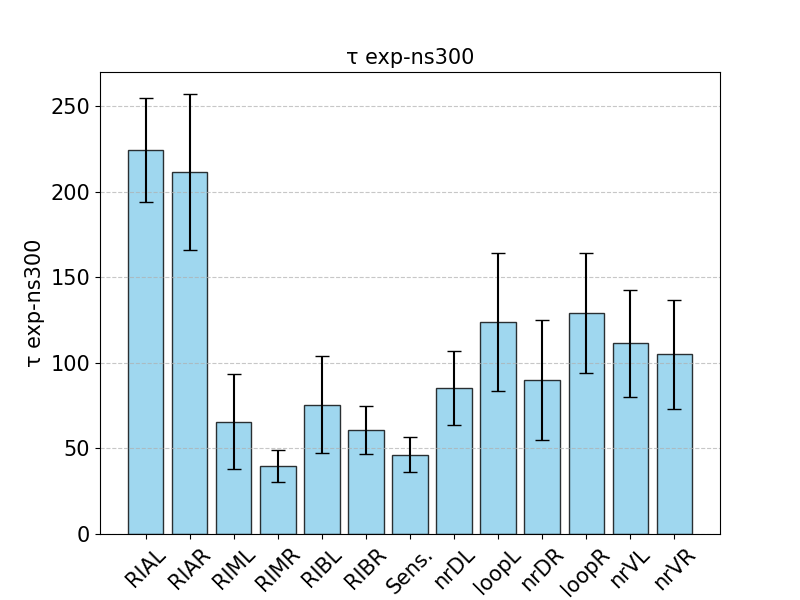

In [46]:
fig1 = Aut.plot_parameters_bar(exp1_All0[worms_to_select,:],n_tit, paramName=f'τ exp1-ns{lim}',fs = 15,r=45)
fig2 = Aut.plot_parameters_bar(threshTimes_All0[worms_to_select,:],n_tit, paramName=f'τ thresh-ns{lim}',fs = 15,r=45)
fig3 = Aut.plot_parameters_bar(Time_constant_All0[worms_to_select,:,0],n_tit, paramName=f'τ exp-ns{lim}',fs = 15,r=45)
for form in ['.png','.pdf']:
    fig1.savefig(f"{outDir}tau_AllNeurons_exp1{lim}.pdf", dpi=res, bbox_inches='tight')
    fig2.savefig(f"{outDir}tau_AllNeurons_thresh{lim}.pdf", dpi=res, bbox_inches='tight')
    fig3.savefig(f"{outDir}tau_AllNeurons_exp{lim}.pdf", dpi=res, bbox_inches='tight')

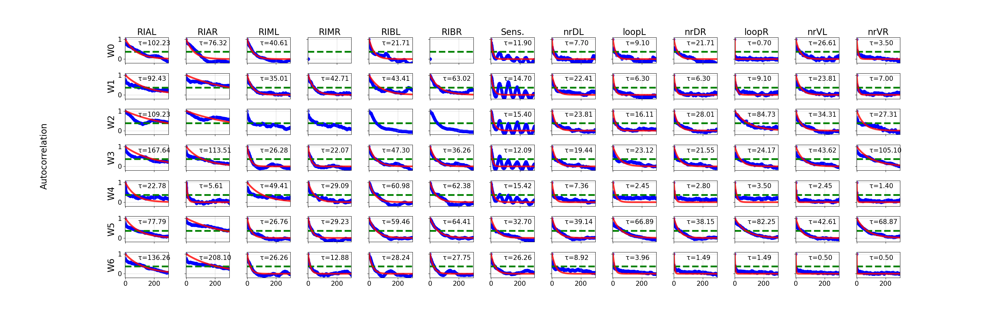

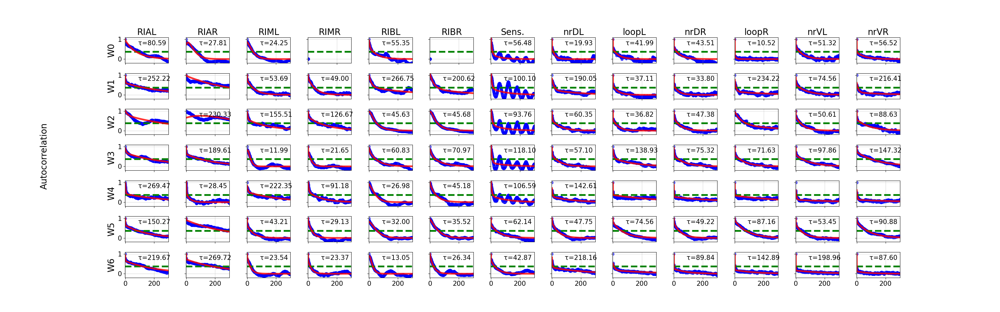

In [48]:
importlib.reload(Aut)
fig1 = Aut.plot_AllneuronsFit_thresh(FullLags_All0,FullAutocorr_All0,n_tit,exp1_All0,threshTimes_All0,L,exp=1,limit=lim)
fig2 = Aut.plot_AllneuronsFit_thresh(FullLags_All0,FullAutocorr_All0,n_tit,de_All0,threshTimes_All0,L,exp=2,limit=lim,writeT=True)
for form in ['.png','.pdf']:
    fig1.savefig(f"{outDir}all_AllNeuronsFit_thresh{lim}.pdf", dpi=res, bbox_inches='tight')
    fig2.savefig(f"{outDir}all_AllNeuronsFit_de{lim}.pdf", dpi=res, bbox_inches='tight')

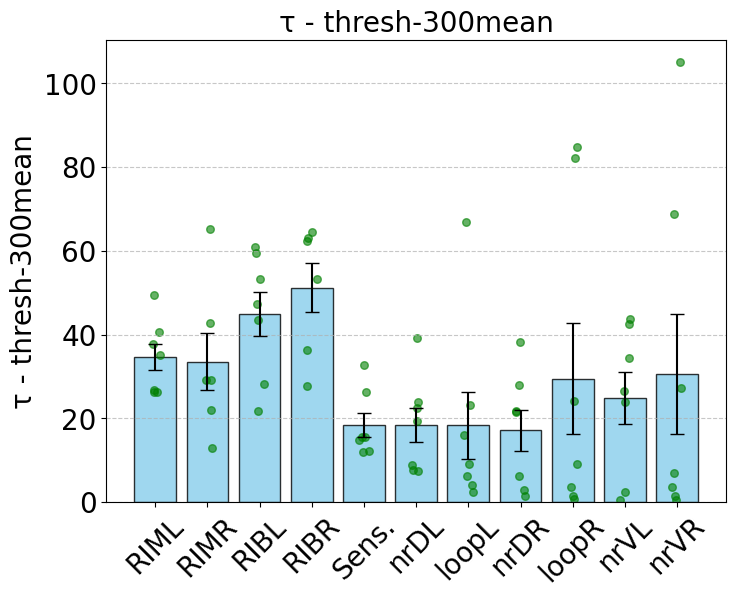

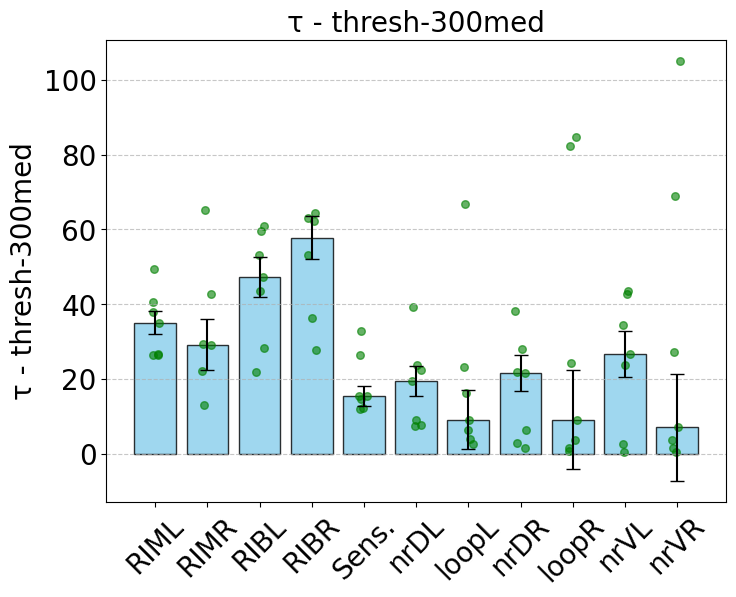

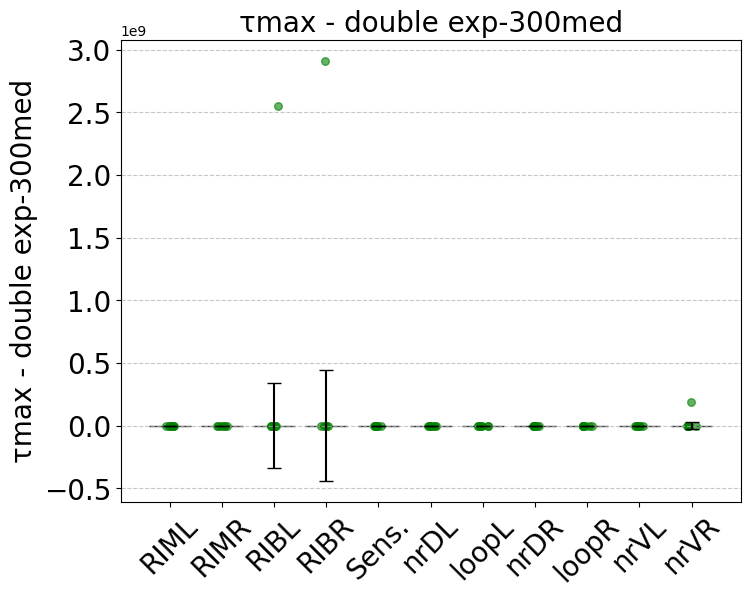

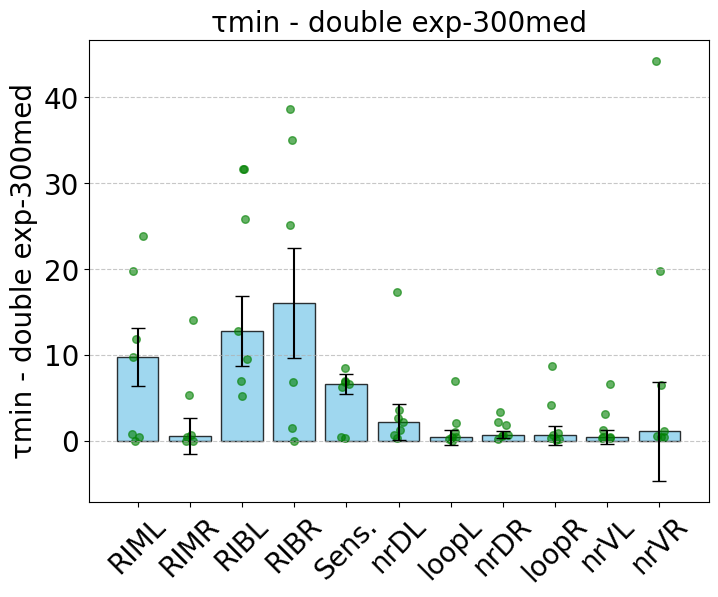

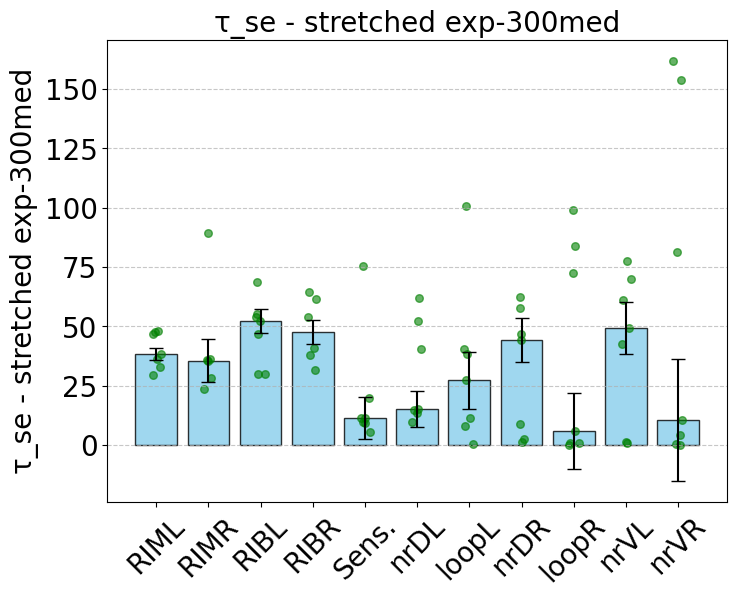

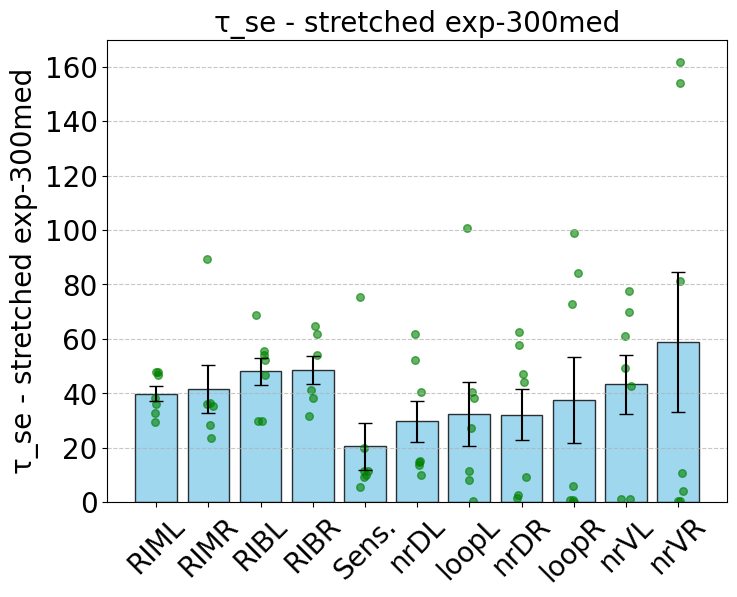

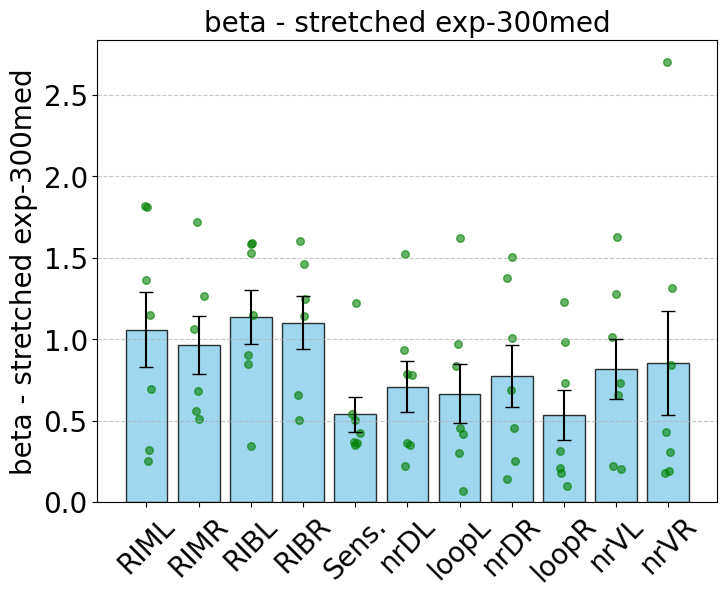

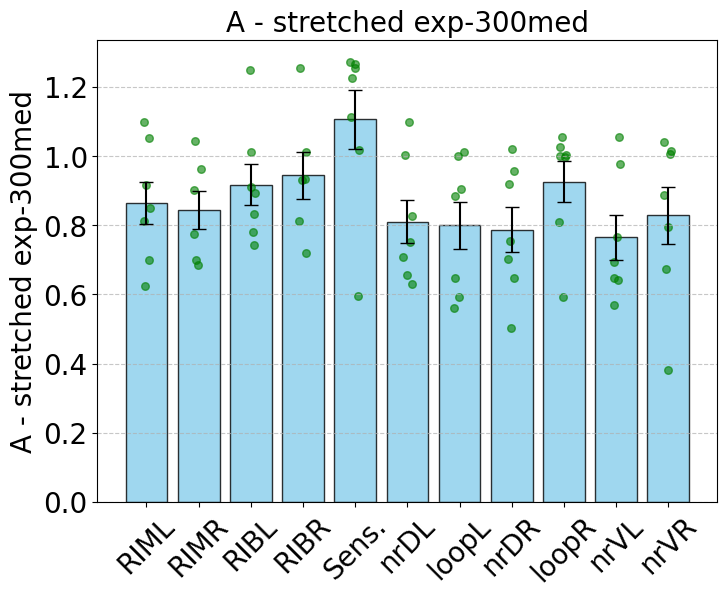

In [28]:
dot=1
Corr='_corr'
st=2
fig1 = Aut.plot_parameters_bar(threshTimes_Alllim[:,st:],n_tit[st:], paramName=f'τ - thresh-{lim}mean',fs = 20,dots=dot,r=45)
fig2 = Aut.plot_parameters_bar(threshTimes_Alllim[:,st:],n_tit[st:], paramName=f'τ - thresh-{lim}med',fs = 20,median=1,dots=dot,r=45)
fig3 = Aut.plot_parameters_bar(np.max(de_Alllim[:,st:,:2],axis=2),n_tit[st:],
                               paramName=f'τmax - double exp-{lim}med',fs = 20,median=1,dots=dot,r=45)
fig4 = Aut.plot_parameters_bar(np.min(de_Alllim[:,st:,:2],axis=2),n_tit[st:],
                               paramName=f'τmin - double exp-{lim}med',fs = 20,median=1,dots=dot,r=45)
##stretched exp
fig5 = Aut.plot_parameters_bar(stretched_exponential_Alllim[:,st:,0],n_tit[st:],
                               paramName=f'τ_se - stretched exp-{lim}med',fs = 20,median=1,dots=dot,r=45)
fig6 = Aut.plot_parameters_bar(stretched_exponential_Alllim[:,st:,0],n_tit[st:],
                               paramName=f'τ_se - stretched exp-{lim}med',fs = 20,dots=dot,r=45)
fig7 = Aut.plot_parameters_bar(stretched_exponential_Alllim[:,st:,1],n_tit[st:],
                               paramName=f'beta - stretched exp-{lim}med',fs = 20,median=0,dots=dot,r=45)
fig8 = Aut.plot_parameters_bar(stretched_exponential_Alllim[:,st:,2],n_tit[st:],
                               paramName=f'A - stretched exp-{lim}med',fs = 20,median=0,dots=dot,r=45)
for form in ['.png','.pdf']:
    fig1.savefig(f"{outDir}AllNeur_thresh_bar_mean{lim}dot{dot}{Corr}{st}{form}", dpi=res, bbox_inches='tight')
    fig2.savefig(f"{outDir}AllNeur_thresh_bar_med{lim}dot{dot}{Corr}{form}", dpi=res, bbox_inches='tight')
    fig3.savefig(f"{outDir}AllNeur_taumax_doubleExp_bar_med{lim}dot{dot}{Corr}{form}", dpi=res, bbox_inches='tight')
    fig4.savefig(f"{outDir}AllNeur_taumin_doubleExp_bar_med{lim}dot{dot}{Corr}{form}", dpi=res, bbox_inches='tight')
    fig5.savefig(f"{outDir}AllNeur_tau_strExp_bar_med{lim}dot{dot}{Corr}{form}", dpi=res, bbox_inches='tight')
    fig6.savefig(f"{outDir}AllNeur_tau_strExp_bar_mean{lim}dot{dot}{Corr}{form}", dpi=res, bbox_inches='tight')
    fig7.savefig(f"{outDir}AllNeur_beta_strExp_bar_mean{lim}dot{dot}{Corr}{form}", dpi=res, bbox_inches='tight')
    fig8.savefig(f"{outDir}AllNeur_A_strExp_bar_mean{lim}dot{dot}{Corr}{form}", dpi=res, bbox_inches='tight')

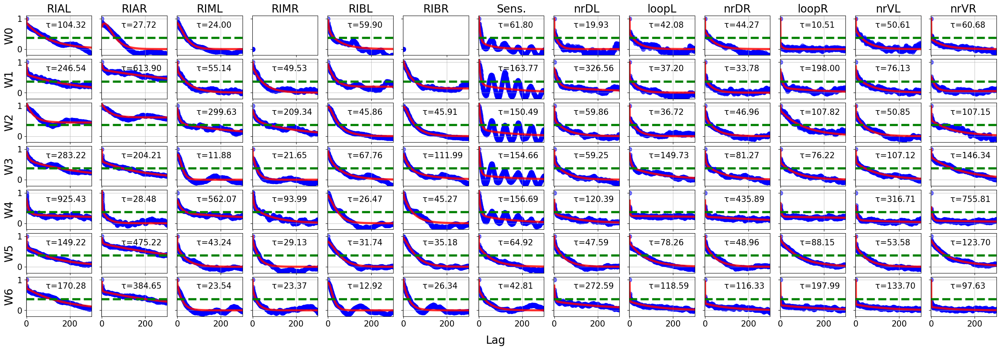

In [22]:
figde,axesde = Aut.plot_AllneuronsFit_thresh(FullLags_Alllim,FullAutocorr_Alllim,n_tit,de_Alllim,threshTimes_Alllim,L,exp=2,limit=lim,writeT=1)
for form in ['.png','.pdf']:
    figde.savefig(f"{outDir}AllNeurons_doubleExpFit{lim}{form}", dpi=res, bbox_inches='tight')
    figde.savefig(f"{outDir}AllNeurons_doubleExpFit{lim}{form}", dpi=res, bbox_inches='tight')

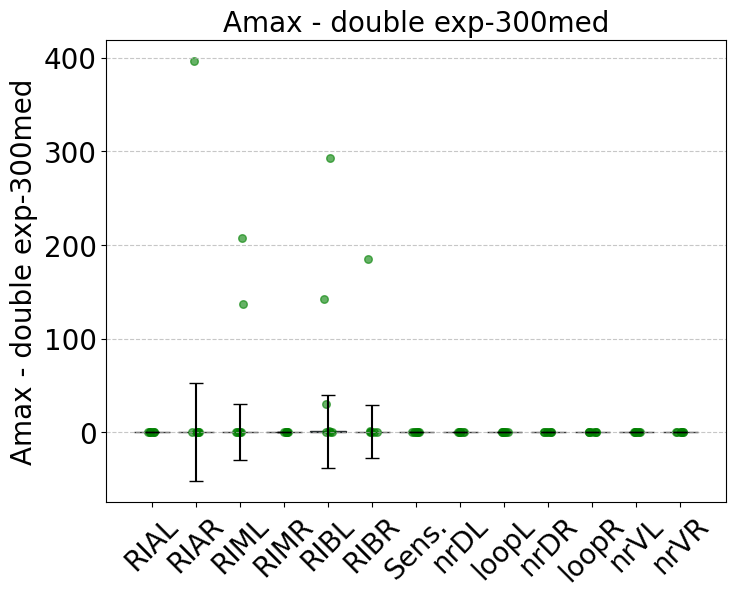

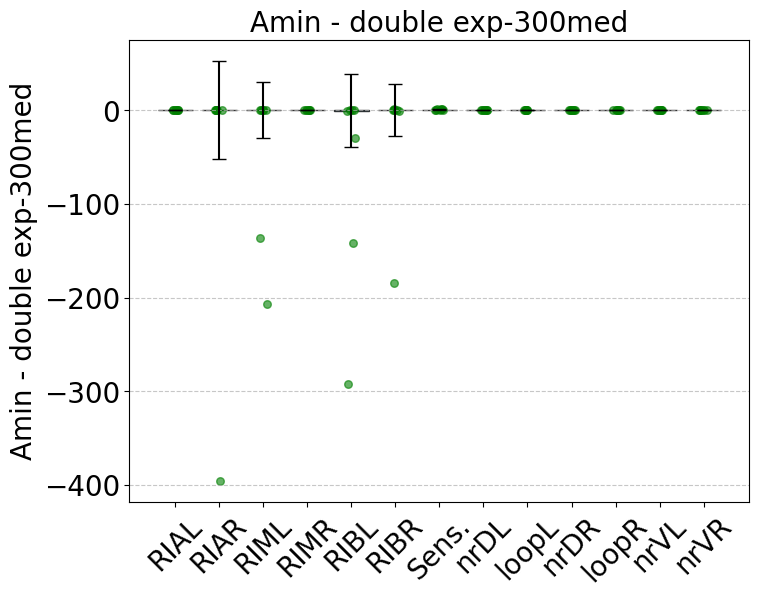

In [27]:
fig1 = Aut.plot_parameters_bar((de_Alllim[:,:,2]),n_tit,
                               paramName=f'Amax - double exp-{lim}med',fs = 20,median=1,dots=dot,r=45)
fig2 = Aut.plot_parameters_bar((de_Alllim[:,:,3]),n_tit,
                               paramName=f'Amin - double exp-{lim}med',fs = 20,median=1,dots=dot,r=45)
for form in ['.png','.pdf']:
    fig1.savefig(f"{outDir}AllNeur_Amax_doubleExp_bar_med{lim}dot{dot}{Corr}{form}", dpi=res, bbox_inches='tight')
    fig2.savefig(f"{outDir}AllNeur_Amin_doubleExp_bar_med{lim}dot{dot}{Corr}{form}", dpi=res, bbox_inches='tight')